# Final Project: Classification of Hand Gestures
## Course: Introduction to AI and ML tools
## Instructor: Dr. Mehdi Norouzi
#### Made by: Nikhil Adlakha


### Importing Packages

In [ ]:
import sklearn
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

## Dataset

1.   Gestures Dataset:
  *   Each record represents a different type of gesture
  *   Each feature represents a sensor reading for a muscle that determines the type of gesture.

Gestures are labeled as **0, 1, 2 or 3**.

The entire dataset is divided into 4 files:
1.   0.csv - containing data points for gesture 0
2.   1.csv - containing data points for gesture 1
3.   2.csv - containing data points for gesture 2
4.   3.csv - containing data points for gesture 3

Source: https://www.kaggle.com/kyr7plus/emg-4


### Load Dataset

In [ ]:
# Reading Datasets
df_0 = pd.read_csv("0.csv",header=None)
df_1 = pd.read_csv("1.csv",header=None)
df_2 = pd.read_csv("2.csv",header=None)
df_3 = pd.read_csv("3.csv",header=None)

### Data Restructuring

This step involves restructuring the data to include the 'Label' field which is included in the dataset and not provided separately. In each of the csv files, the last column of the file contains the label for the data point. Since, we cannot proceed further without having a label column. We will process it here.

In [ ]:
# Renaming last column which contains the labels to 'Gesture'
df_0 = df_0.rename(columns={df_0.columns[-1]:'Gesture'})
df_1 = df_1.rename(columns={df_1.columns[-1]:'Gesture'})
df_2 = df_2.rename(columns={df_2.columns[-1]:'Gesture'})
df_3 = df_3.rename(columns={df_3.columns[-1]:'Gesture'})

In [ ]:
# Concatenating the dataframes to make an entire dataset in one DataFrame
df = pd.concat([df_0, df_1, df_2, df_3], ignore_index=True)
df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,Gesture
0,26.0,4.0,5.0,8.0,-1.0,-13.0,-109.0,-66.0,-9.0,2.0,4.0,13.0,-18.0,-30.0,-119.0,-45.0,17.0,6.0,-1.0,-9.0,27.0,20.0,91.0,71.0,-26.0,-1.0,0.0,1.0,13.0,20.0,-62.0,-19.0,29.0,2.0,2.0,0.0,-23.0,-1.0,-80.0,4.0,-7.0,-6.0,-12.0,-27.0,-11.0,-16.0,-67.0,-8.0,-27.0,1.0,1.0,13.0,-8.0,-11.0,21.0,-28.0,61.0,4.0,8.0,5.0,4.0,-7.0,-59.0,16.0,0
1,-47.0,-6.0,-5.0,-7.0,13.0,-1.0,35.0,-10.0,10.0,-4.0,0.0,7.0,-31.0,-33.0,-48.0,-52.0,34.0,10.0,5.0,-9.0,23.0,63.0,76.0,49.0,-27.0,-7.0,-7.0,-3.0,0.0,4.0,-111.0,-2.0,-7.0,7.0,11.0,11.0,2.0,2.0,76.0,3.0,7.0,-2.0,0.0,-6.0,21.0,-3.0,0.0,-8.0,-40.0,-4.0,-1.0,6.0,-2.0,-2.0,-105.0,-25.0,47.0,6.0,6.0,5.0,13.0,21.0,111.0,15.0,0
2,-19.0,-8.0,-8.0,-8.0,-21.0,-6.0,-79.0,12.0,0.0,5.0,4.0,16.0,24.0,9.0,33.0,34.0,-1.0,-4.0,-3.0,-6.0,-7.0,-11.0,-85.0,-12.0,-10.0,-2.0,-3.0,-2.0,-8.0,-30.0,-16.0,-22.0,-21.0,-7.0,-8.0,-12.0,-14.0,-18.0,-76.0,-44.0,27.0,7.0,4.0,-4.0,-10.0,23.0,127.0,69.0,-25.0,-12.0,-9.0,1.0,18.0,-33.0,-128.0,-83.0,7.0,7.0,1.0,-8.0,7.0,21.0,114.0,48.0,0
3,2.0,3.0,0.0,2.0,0.0,22.0,106.0,-14.0,-16.0,-2.0,-3.0,-4.0,18.0,21.0,-9.0,2.0,-8.0,0.0,3.0,5.0,-14.0,-15.0,13.0,-13.0,11.0,-4.0,-5.0,-8.0,-30.0,-27.0,-128.0,-22.0,-3.0,-5.0,-8.0,0.0,25.0,-9.0,-28.0,2.0,-22.0,8.0,8.0,-2.0,2.0,12.0,53.0,20.0,28.0,-9.0,-5.0,-5.0,-7.0,-7.0,-54.0,-38.0,-11.0,4.0,7.0,11.0,33.0,39.0,119.0,43.0,0
4,6.0,0.0,0.0,-2.0,-14.0,10.0,-51.0,5.0,7.0,0.0,4.0,13.0,13.0,-16.0,-45.0,-7.0,-84.0,-8.0,-3.0,-4.0,-36.0,-26.0,-128.0,-55.0,75.0,3.0,-8.0,-12.0,14.0,12.0,87.0,56.0,-3.0,2.0,0.0,-7.0,4.0,15.0,-13.0,0.0,-15.0,1.0,3.0,8.0,-2.0,-6.0,-55.0,-24.0,1.0,5.0,5.0,2.0,11.0,12.0,60.0,38.0,-35.0,-8.0,2.0,6.0,-13.0,-24.0,-112.0,-69.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11673,-3.0,-1.0,-1.0,-1.0,-28.0,20.0,5.0,0.0,-5.0,0.0,2.0,5.0,-10.0,-17.0,-3.0,-2.0,12.0,2.0,2.0,2.0,-4.0,-28.0,1.0,-6.0,-5.0,-1.0,1.0,0.0,11.0,9.0,-4.0,14.0,2.0,-2.0,-2.0,-8.0,-17.0,1.0,-2.0,6.0,-14.0,-3.0,-4.0,-2.0,27.0,18.0,-6.0,-17.0,-4.0,1.0,-2.0,1.0,13.0,-12.0,-3.0,-3.0,1.0,4.0,3.0,4.0,-51.0,-49.0,5.0,-9.0,3
11674,-13.0,-5.0,-4.0,-3.0,-4.0,-24.0,-10.0,-8.0,20.0,9.0,9.0,7.0,5.0,50.0,31.0,18.0,-3.0,-3.0,1.0,-2.0,17.0,-6.0,-10.0,-18.0,-11.0,-5.0,-2.0,-2.0,10.0,21.0,-2.0,15.0,5.0,-2.0,-2.0,-6.0,-6.0,-50.0,-16.0,7.0,-12.0,-2.0,-3.0,1.0,21.0,48.0,12.0,-12.0,-1.0,3.0,2.0,5.0,-12.0,-8.0,5.0,6.0,-3.0,-3.0,-3.0,-5.0,-4.0,-45.0,-12.0,-15.0,3
11675,-1.0,-3.0,-1.0,1.0,30.0,38.0,-1.0,36.0,-10.0,1.0,4.0,0.0,-3.0,33.0,-2.0,-1.0,-1.0,2.0,-3.0,0.0,-38.0,-25.0,0.0,3.0,2.0,-1.0,0.0,-3.0,14.0,0.0,-1.0,-3.0,-3.0,-4.0,-3.0,-6.0,-2.0,13.0,-5.0,-19.0,-6.0,-5.0,-4.0,1.0,41.0,-10.0,-4.0,-9.0,3.0,3.0,2.0,3.0,1.0,50.0,12.0,14.0,-8.0,-4.0,-4.0,-4.0,-21.0,-29.0,-5.0,0.0,3
11676,1.0,4.0,4.0,5.0,9.0,-10.0,4.0,1.0,-2.0,-1.0,-1.0,-1.0,-5.0,12.0,1.0,-19.0,0.0,-4.0,-4.0,0.0,25.0,0.0,3.0,-5.0,1.0,1.0,-2.0,-4.0,-31.0,-17.0,-7.0,5.0,3.0,-5.0,-3.0,-1.0,4.0,-48.0,-13.0,-5.0,-14.0,6.0,5.0,6.0,-3.0,79.0,15.0,-6.0,-3.0,-1.0,-3.0,-1.0,-1.0,27.0,-2.0,-16.0,-3.0,0.0,-3.0,-5.0,-36.0,-90.0,3.0,5.0,3



## Data Cleaning

This step involves cleaning the data in the dataset, by removing the rows or records which have null values or gaps.

### Visualizing Rows with null values or gaps

In [ ]:
# This block will help visualize, whether there are any data points with null values
print("Are there any null values or gaps in any row of the dataset: ",df.isnull().values.any())
print("Rows of the dataset that have null values or gaps:")
df[df.isnull().T.any()]

Are there any null values or gaps in any row of the dataset:  False
Rows of the dataset that have null values or gaps:


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,Gesture


### Removing Rows with null values or gaps

In [ ]:
# This block performs data cleaning
df = df.drop(df[df.isnull().T.any()].index)

## Summarizing Data

### Building Statistics for each column in the dataset

In [ ]:
df_agg = df.aggregate({column : ['min','max', 'count', 'sum', 'mean','median', 'std', 'var'] for column in df.columns})
df_agg

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,Gesture
min,-116.000000,-104.000000,-33.000000,-75.000000,-121.000000,-122.000000,-128.000000,-128.000000,-110.000000,-128.000000,-36.000000,-84.000000,-102.000000,-128.000000,-128.000000,-128.000000,-119.000000,-109.000000,-38.000000,-99.000000,-103.000000,-120.000000,-128.000000,-118.000000,-108.000000,-115.000000,-28.000000,-95.000000,-108.000000,-128.000000,-128.000000,-128.000000,-104.000000,-112.000000,-56.000000,-85.000000,-95.000000,-128.000000,-128.000000,-128.000000,-121.000000,-120.000000,-39.000000,-79.000000,-102.000000,-123.000000,-128.000000,-128.000000,-128.000000,-120.000000,-54.000000,-86.000000,-117.000000,-128.000000,-128.000000,-128.000000,-116.000000,-128.000000,-46.000000,-74.000000,-103.000000,-128.000000,-128.000000,-124.000000,0.000000
max,111.000000,90.000000,34.000000,55.000000,92.000000,127.000000,127.000000,126.000000,127.000000,106.000000,42.000000,61.000000,83.000000,127.000000,127.000000,127.000000,127.000000,118.000000,34.000000,47.000000,90.000000,127.000000,127.000000,108.000000,120.000000,123.000000,38.000000,44.000000,114.000000,127.000000,127.000000,127.000000,127.000000,102.000000,44.000000,56.000000,90.000000,127.000000,127.000000,127.000000,118.000000,106.000000,65.000000,54.000000,115.000000,127.000000,127.000000,127.000000,112.000000,111.000000,57.000000,76.000000,92.000000,127.000000,127.000000,114.000000,127.000000,105.000000,29.000000,51.000000,110.000000,127.000000,127.000000,127.000000,3.000000
count,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000,11678.000000
sum,-6077.000000,-8488.000000,-8631.000000,-8522.000000,-1858.000000,-6480.000000,-14862.000000,-7729.000000,-7777.000000,-7640.000000,-8426.000000,-8480.000000,1284.000000,-1971.000000,-15397.000000,-9745.000000,-9121.000000,-7508.000000,-8852.000000,-8557.000000,207.000000,-2316.000000,-14651.000000,-7027.000000,-7094.000000,-8391.000000,-8638.000000,-7928.000000,-1031.000000,-4870.000000,-15754.000000,-9642.000000,-10653.000000,-8929.000000,-9030.000000,-7634.000000,-533.000000,-2347.000000,-16939.000000,-9384.000000,-9370.000000,-9825.000000,-9227.000000,-7554.000000,-1861.000000,-5910.000000,-16727.000000,-7952.000000,-7158.000000,-9558.000000,-9334.000000,-8430.000000,-809.000000,-4281.000000,-18947.000000,-10892.000000,-9774.000000,-8649.000000,-8977.000000,-8237.000000,-1713.000000,-4377.000000,-16925.000000,-7113.000000,17555.000000
mean,-0.520380,-0.726837,-0.739082,-0.729748,-0.159103,-0.554890,-1.272649,-0.661843,-0.665953,-0.654222,-0.721528,-0.726152,0.109950,-0.168779,-1.318462,-0.834475,-0.781041,-0.642918,-0.758007,-0.732745,0.017726,-0.198322,-1.254581,-0.601730,-0.607467,-0.718531,-0.739681,-0.678883,-0.088286,-0.417023,-1.349032,-0.825655,-0.912228,-0.764600,-0.773249,-0.653708,-0.045641,-0.200976,-1.450505,-0.803562,-0.802363,-0.841326,-0.790118,-0.646857,-0.159359,-0.506080,-1.432351,-0.680939,-0.612947,-0.818462,-0.799281,-0.721870,-0.069276,-0.366587,-1.622452,-0.932694,-0.836958,-0.740623,-0.768710,-0.705343,-0.146686,-0.374807,-1.449306,-0.609094,1.

### Is Data Balanced?

I have referred to the website: https://developers.google.com/machine-learning/data-prep/construct/sampling-splitting/imbalanced-data, for taking the thresholds for defining imbalanced datasets.

#### Count-plot for showing that dataset approximately has same number of data points for each gesture

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


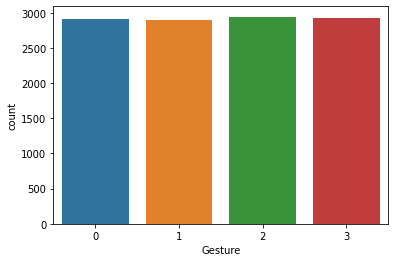

In [ ]:
sns.countplot(df['Gesture'])

#### Mathematically, taking out the gestures who are minority classes.

In [ ]:
# This method applies a class like Major/Minor:
def apply_class(x):
  if 0 < x < 40:
    return 'Minority'
  else:
    return 'Majority'

In [ ]:
def get_imbalance(x):
  if x < 1.0:
    return 'Extreme'
  elif 1.0 <= x < 20.0:
    return 'Moderate'
  elif 20.0 <= x < 40.0:
    return 'Mild'
  else:
    return None

In [ ]:
# Take out the unique values of column: Gesture
unique_values = df['Gesture'].unique()
# Count the number of data points for each Gesture
is_balanced = pd.DataFrame({val: [df[df['Gesture'] == val].count().values[0]] for val in unique_values}).T
# Store the Gesture in column Gesture
is_balanced['Gesture'] = unique_values
# Take out the percentage of the total dataset, that each Gesture has
is_balanced['percentage'] = is_balanced[0].apply(lambda x: (x/df.shape[0]) * 100)
# Dropping not required column
is_balanced = is_balanced.drop(columns=[0])
# Assign a class [Majority/Minority] to each unique Gesture
is_balanced['class'] = is_balanced['percentage'].apply(apply_class)
# Find out the degree of imbalance in Minority class(es)
is_balanced['degree_of_imbalance']= is_balanced['percentage'].apply(get_imbalance)
# Print the dataframe, after operations
is_balanced

,Gesture,percentage,class,degree_of_imbalance
0,0,24.918650,Minority,Mild
1,1,24.858709,Minority,Mild
2,2,25.201233,Minority,Mild
3,3,25.021408,Minority,Mild


In [ ]:
# Take out the Gestures which are minority classes, but are not mild.
majorly_imbalanced_labels = is_balanced[is_balanced['degree_of_imbalance'] != 'Mild']
# Take out the total count of these Gestures
no_imbalances = majorly_imbalanced_labels['Gesture'].count()
# Print out the results
print(f"There are {no_imbalances} majorly imbalanced labels in the dataset.")
print("They are:")
majorly_imbalanced_labels

There are 0 majorly imbalanced labels in the dataset.
They are:


,Gesture,percentage,class,degree_of_imbalance


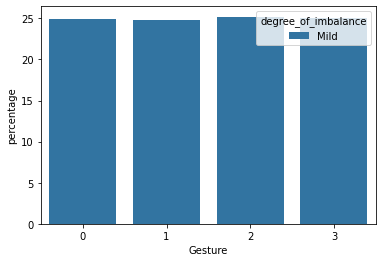

In [ ]:
# Visually depict the distribution of Gestures, based on classes and imbalance in datasets
sns.barplot(x="Gesture", y="percentage", data=is_balanced, hue='degree_of_imbalance')

In [ ]:
# Print out the final outcome of pre-processing ...
if no_imbalances:
  print("Processing for Imbalanced classes")
else:
  print("The data is (relatively) balanced...")

The data is (relatively) balanced...


## Problem Definition

To determine the performance of classifiers trained with the given dataset and to compare the models, based on performance, to see the effects of the training set on a model.

## Feature Extraction

In [ ]:
gestures = df['Gesture']
df_features = df[df.columns[0:64]]
df_features

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63
0,26.0,4.0,5.0,8.0,-1.0,-13.0,-109.0,-66.0,-9.0,2.0,4.0,13.0,-18.0,-30.0,-119.0,-45.0,17.0,6.0,-1.0,-9.0,27.0,20.0,91.0,71.0,-26.0,-1.0,0.0,1.0,13.0,20.0,-62.0,-19.0,29.0,2.0,2.0,0.0,-23.0,-1.0,-80.0,4.0,-7.0,-6.0,-12.0,-27.0,-11.0,-16.0,-67.0,-8.0,-27.0,1.0,1.0,13.0,-8.0,-11.0,21.0,-28.0,61.0,4.0,8.0,5.0,4.0,-7.0,-59.0,16.0
1,-47.0,-6.0,-5.0,-7.0,13.0,-1.0,35.0,-10.0,10.0,-4.0,0.0,7.0,-31.0,-33.0,-48.0,-52.0,34.0,10.0,5.0,-9.0,23.0,63.0,76.0,49.0,-27.0,-7.0,-7.0,-3.0,0.0,4.0,-111.0,-2.0,-7.0,7.0,11.0,11.0,2.0,2.0,76.0,3.0,7.0,-2.0,0.0,-6.0,21.0,-3.0,0.0,-8.0,-40.0,-4.0,-1.0,6.0,-2.0,-2.0,-105.0,-25.0,47.0,6.0,6.0,5.0,13.0,21.0,111.0,15.0
2,-19.0,-8.0,-8.0,-8.0,-21.0,-6.0,-79.0,12.0,0.0,5.0,4.0,16.0,24.0,9.0,33.0,34.0,-1.0,-4.0,-3.0,-6.0,-7.0,-11.0,-85.0,-12.0,-10.0,-2.0,-3.0,-2.0,-8.0,-30.0,-16.0,-22.0,-21.0,-7.0,-8.0,-12.0,-14.0,-18.0,-76.0,-44.0,27.0,7.0,4.0,-4.0,-10.0,23.0,127.0,69.0,-25.0,-12.0,-9.0,1.0,18.0,-33.0,-128.0,-83.0,7.0,7.0,1.0,-8.0,7.0,21.0,114.0,48.0
3,2.0,3.0,0.0,2.0,0.0,22.0,106.0,-14.0,-16.0,-2.0,-3.0,-4.0,18.0,21.0,-9.0,2.0,-8.0,0.0,3.0,5.0,-14.0,-15.0,13.0,-13.0,11.0,-4.0,-5.0,-8.0,-30.0,-27.0,-128.0,-22.0,-3.0,-5.0,-8.0,0.0,25.0,-9.0,-28.0,2.0,-22.0,8.0,8.0,-2.0,2.0,12.0,53.0,20.0,28.0,-9.0,-5.0,-5.0,-7.0,-7.0,-54.0,-38.0,-11.0,4.0,7.0,11.0,33.0,39.0,119.0,43.0
4,6.0,0.0,0.0,-2.0,-14.0,10.0,-51.0,5.0,7.0,0.0,4.0,13.0,13.0,-16.0,-45.0,-7.0,-84.0,-8.0,-3.0,-4.0,-36.0,-26.0,-128.0,-55.0,75.0,3.0,-8.0,-12.0,14.0,12.0,87.0,56.0,-3.0,2.0,0.0,-7.0,4.0,15.0,-13.0,0.0,-15.0,1.0,3.0,8.0,-2.0,-6.0,-55.0,-24.0,1.0,5.0,5.0,2.0,11.0,12.0,60.0,38.0,-35.0,-8.0,2.0,6.0,-13.0,-24.0,-112.0,-69.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11673,-3.0,-1.0,-1.0,-1.0,-28.0,20.0,5.0,0.0,-5.0,0.0,2.0,5.0,-10.0,-17.0,-3.0,-2.0,12.0,2.0,2.0,2.0,-4.0,-28.0,1.0,-6.0,-5.0,-1.0,1.0,0.0,11.0,9.0,-4.0,14.0,2.0,-2.0,-2.0,-8.0,-17.0,1.0,-2.0,6.0,-14.0,-3.0,-4.0,-2.0,27.0,18.0,-6.0,-17.0,-4.0,1.0,-2.0,1.0,13.0,-12.0,-3.0,-3.0,1.0,4.0,3.0,4.0,-51.0,-49.0,5.0,-9.0
11674,-13.0,-5.0,-4.0,-3.0,-4.0,-24.0,-10.0,-8.0,20.0,9.0,9.0,7.0,5.0,50.0,31.0,18.0,-3.0,-3.0,1.0,-2.0,17.0,-6.0,-10.0,-18.0,-11.0,-5.0,-2.0,-2.0,10.0,21.0,-2.0,15.0,5.0,-2.0,-2.0,-6.0,-6.0,-50.0,-16.0,7.0,-12.0,-2.0,-3.0,1.0,21.0,48.0,12.0,-12.0,-1.0,3.0,2.0,5.0,-12.0,-8.0,5.0,6.0,-3.0,-3.0,-3.0,-5.0,-4.0,-45.0,-12.0,-15.0
11675,-1.0,-3.0,-1.0,1.0,30.0,38.0,-1.0,36.0,-10.0,1.0,4.0,0.0,-3.0,33.0,-2.0,-1.0,-1.0,2.0,-3.0,0.0,-38.0,-25.0,0.0,3.0,2.0,-1.0,0.0,-3.0,14.0,0.0,-1.0,-3.0,-3.0,-4.0,-3.0,-6.0,-2.0,13.0,-5.0,-19.0,-6.0,-5.0,-4.0,1.0,41.0,-10.0,-4.0,-9.0,3.0,3.0,2.0,3.0,1.0,50.0,12.0,14.0,-8.0,-4.0,-4.0,-4.0,-21.0,-29.0,-5.0,0.0
11676,1.0,4.0,4.0,5.0,9.0,-10.0,4.0,1.0,-2.0,-1.0,-1.0,-1.0,-5.0,12.0,1.0,-19.0,0.0,-4.0,-4.0,0.0,25.0,0.0,3.0,-5.0,1.0,1.0,-2.0,-4.0,-31.0,-17.0,-7.0,5.0,3.0,-5.0,-3.0,-1.0,4.0,-48.0,-13.0,-5.0,-14.0,6.0,5.0,6.0,-3.0,79.0,15.0,-6.0,-3.0,-1.0,-3.0,-1.0,-1.0,27.0,-2.0,-16.0,-3.0,0.0,-3.0,-5.0,-36.0,-90.0,3.0,5.0


#### HeatMap for Feature Correlation

Please zoom in to look.

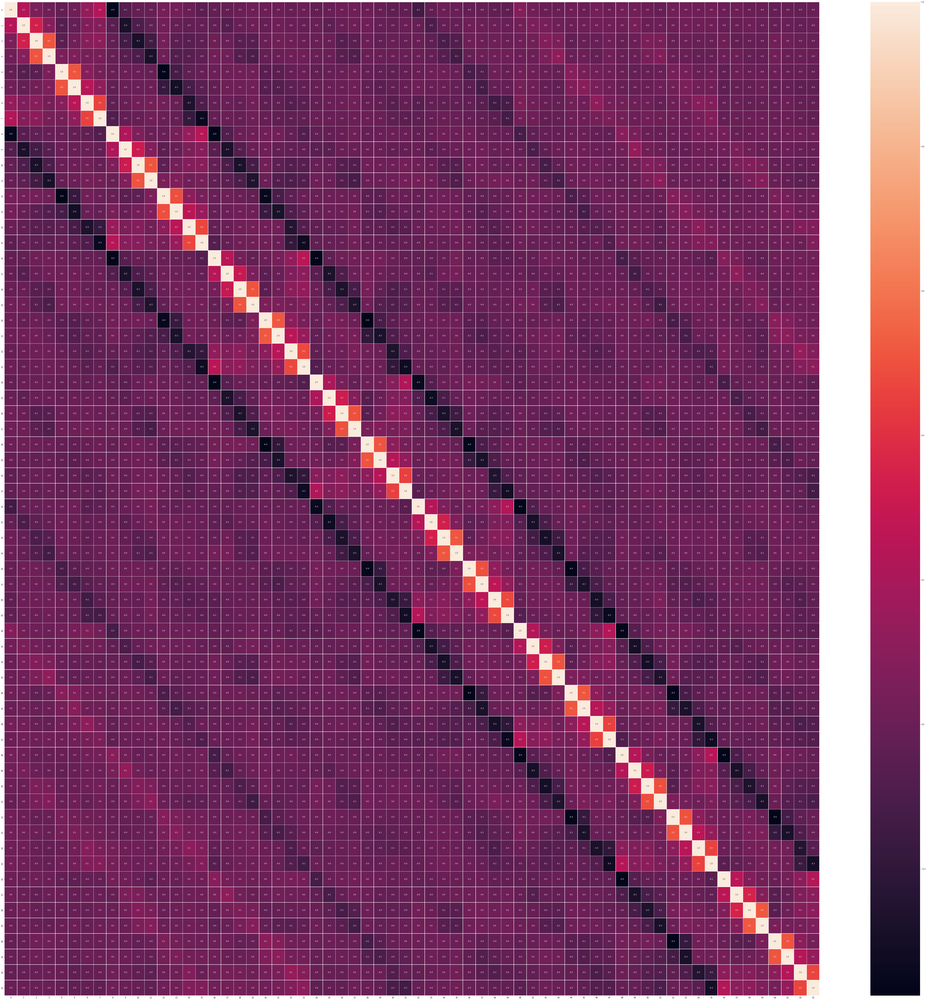

In [ ]:
f, ax = plt.subplots(figsize=(100,100))
sns.heatmap(df_features.corr(), annot=True, fmt='.1f',linewidths=.5,ax=ax)

**Conclusion:** There are some correlations among the readings of the sensors of the same muscles.

#### Direct Correlations

There are some direct correlations found among the sensor readings of the same muscles, which are shown below:

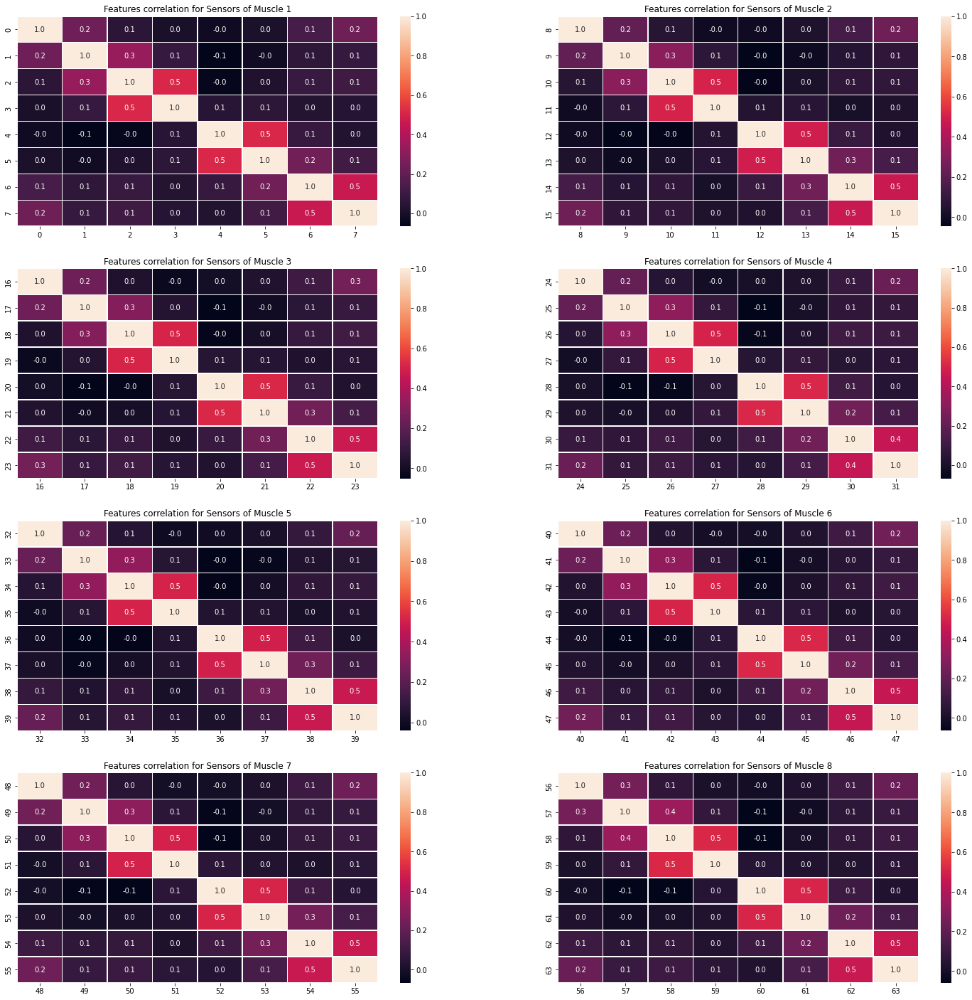

In [ ]:
f, ax = plt.subplots(4,2, figsize=(25,25))
# For each muscle, visualizing the correlation of sensor readings
for i in range(4):
  for j in range(2):
    k = 2 * i + j
    sns.heatmap(df_features[df_features.columns[8*k:8*(k+1)]].corr(), annot=True, fmt='.1f',linewidths=.5,ax=ax[i][j])
    ax[i][j].set_title(f"Features correlation for Sensors of Muscle {k+1}")

#### Reverse Correlations

There also exists reverse correlations between readings of a muscle and the correspoonding sensor for the next muscle, which are shown below:

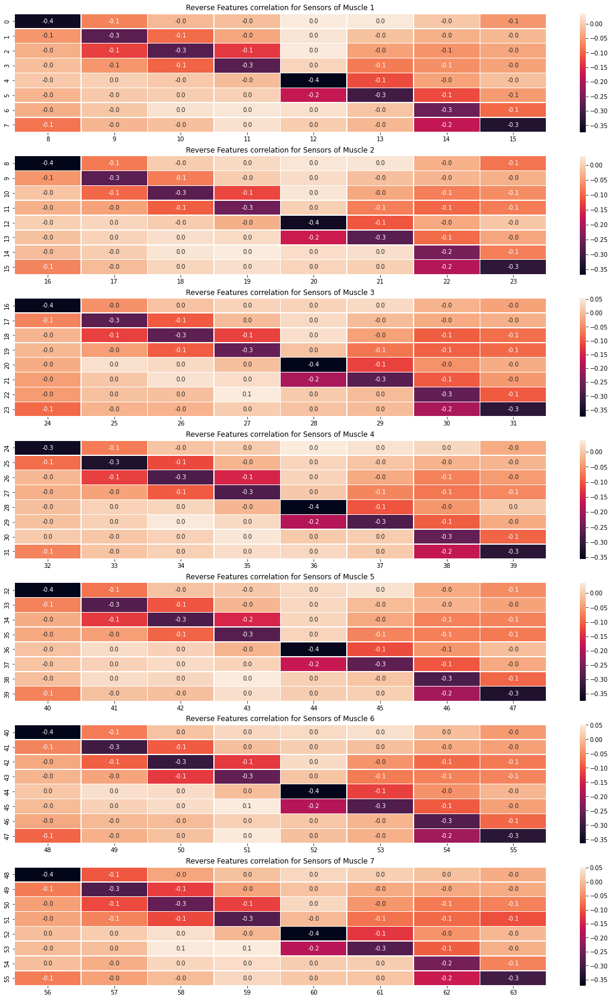

In [ ]:
f, ax = plt.subplots(7,1, figsize=(20,30))
# For each muscle, visualizing the correlation of sensor readings
for i in range(7):
  k = i
  data = df_features[df_features.columns[8*k:8*(k+2)]].corr().iloc[0:8][df_features.columns[8*(k+1):8*(k+2)]]
  sns.heatmap(data, annot=True, fmt='.1f',linewidths=.5,ax=ax[i])
  ax[i].set_title(f"Reverse Features correlation for Sensors of Muscle {k+1}")

#### PairPlots

Please uncomment the code below to look at all the pairplots for all the features.
(It was commented because it takes a lot of time to plot).

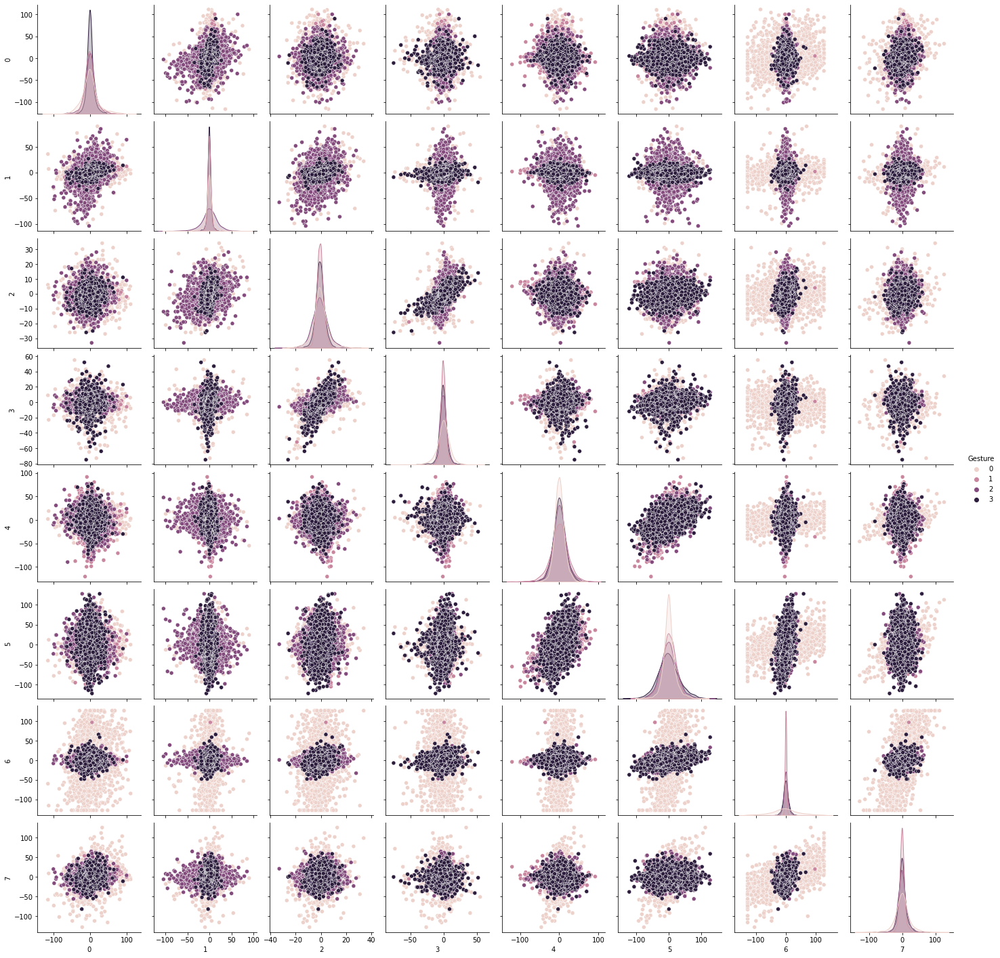

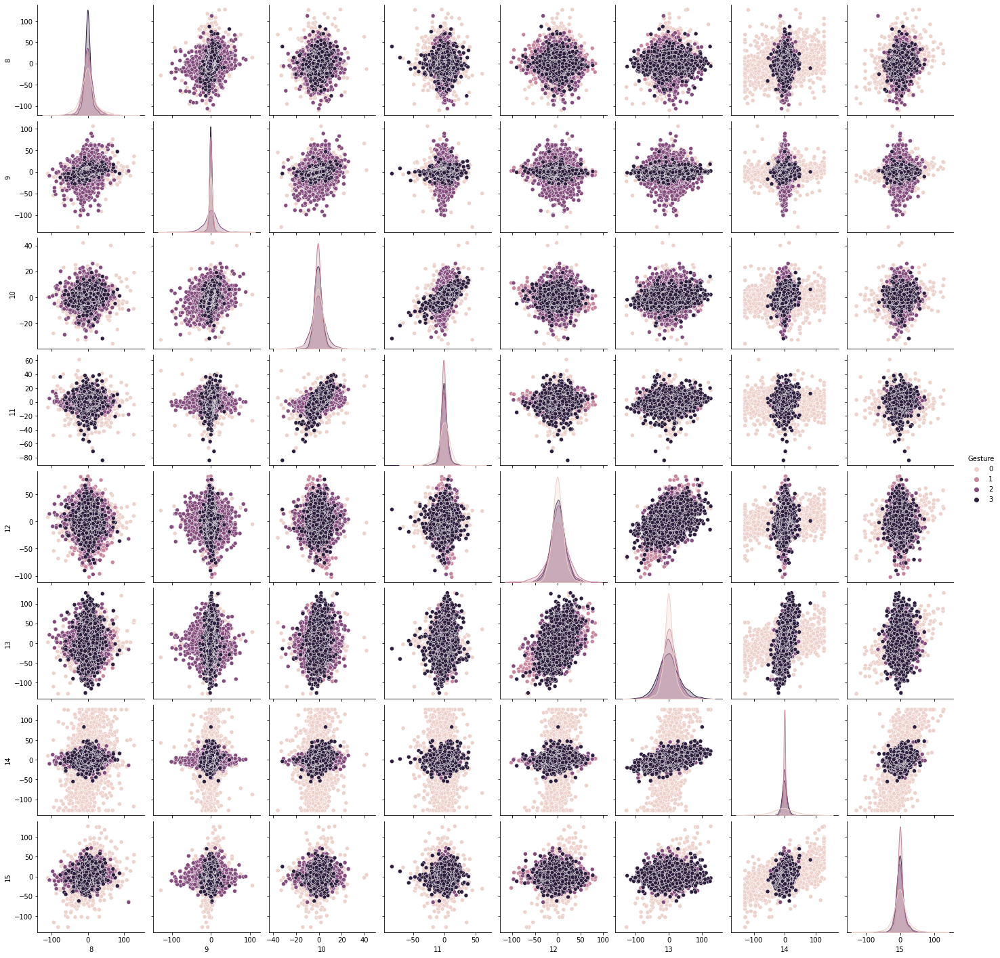

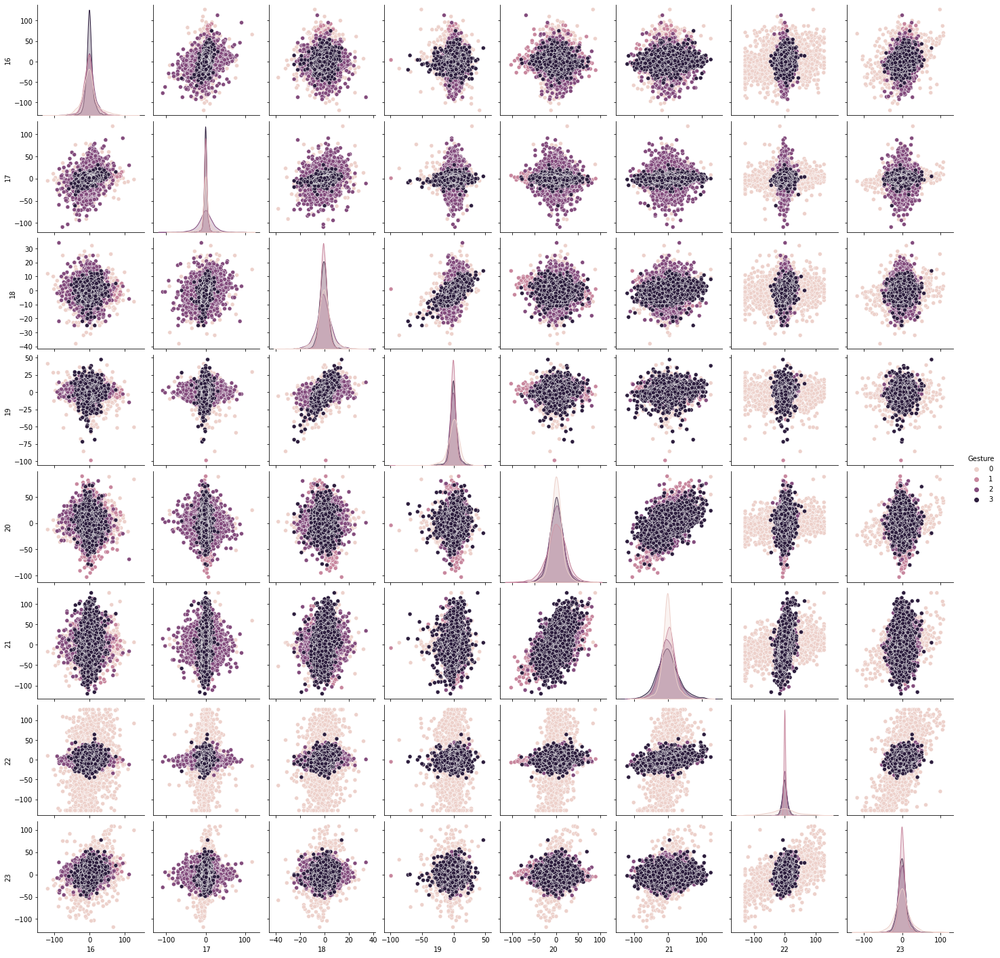

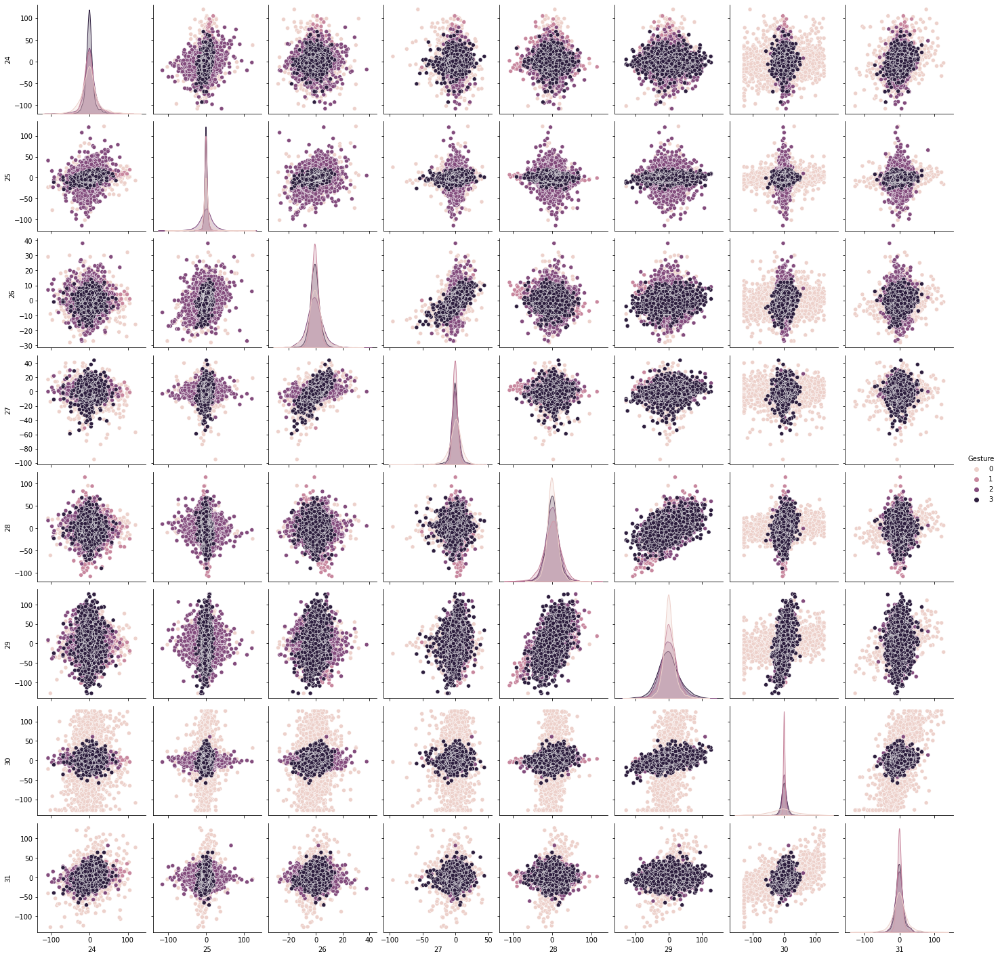

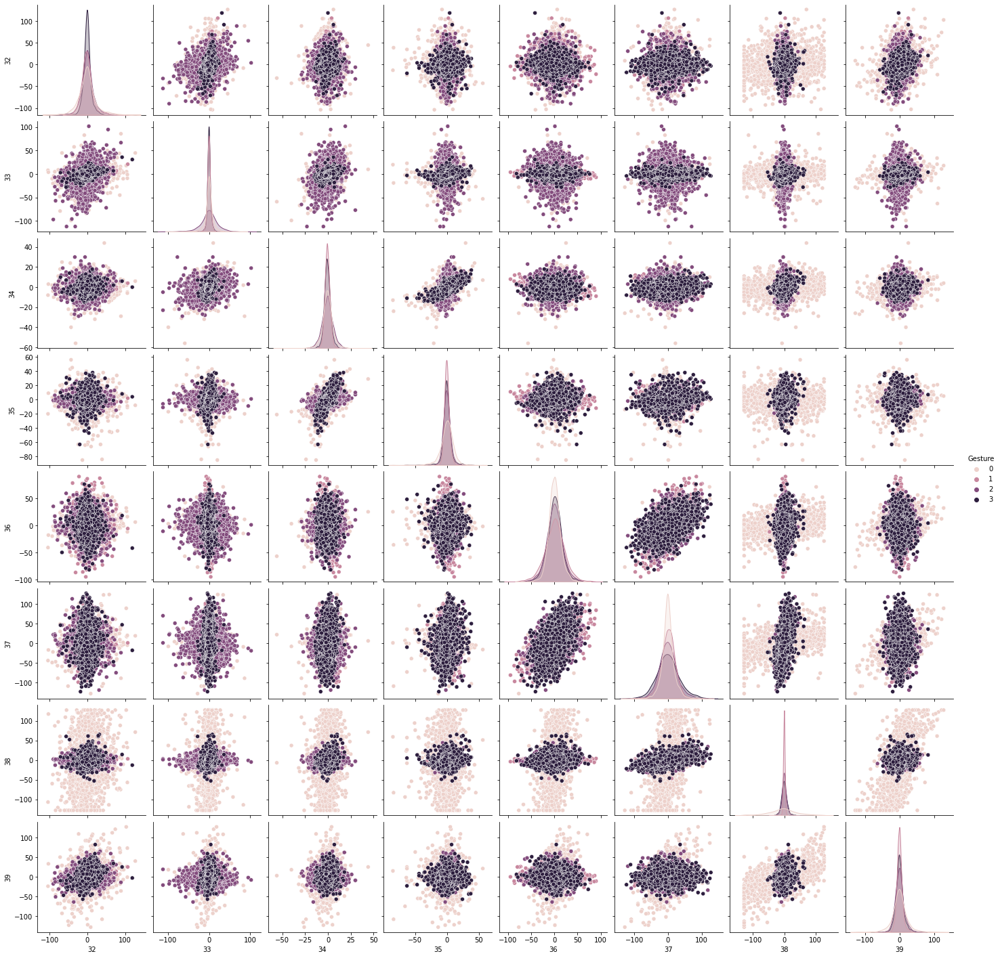

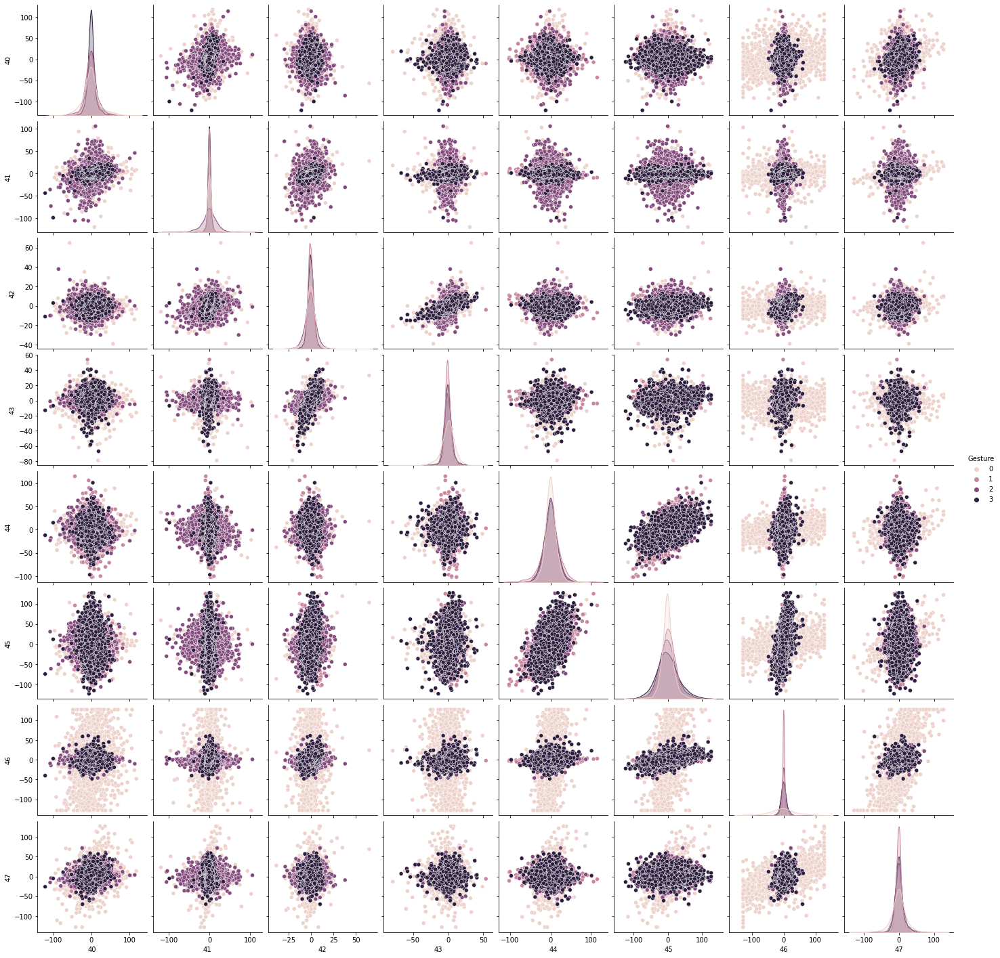

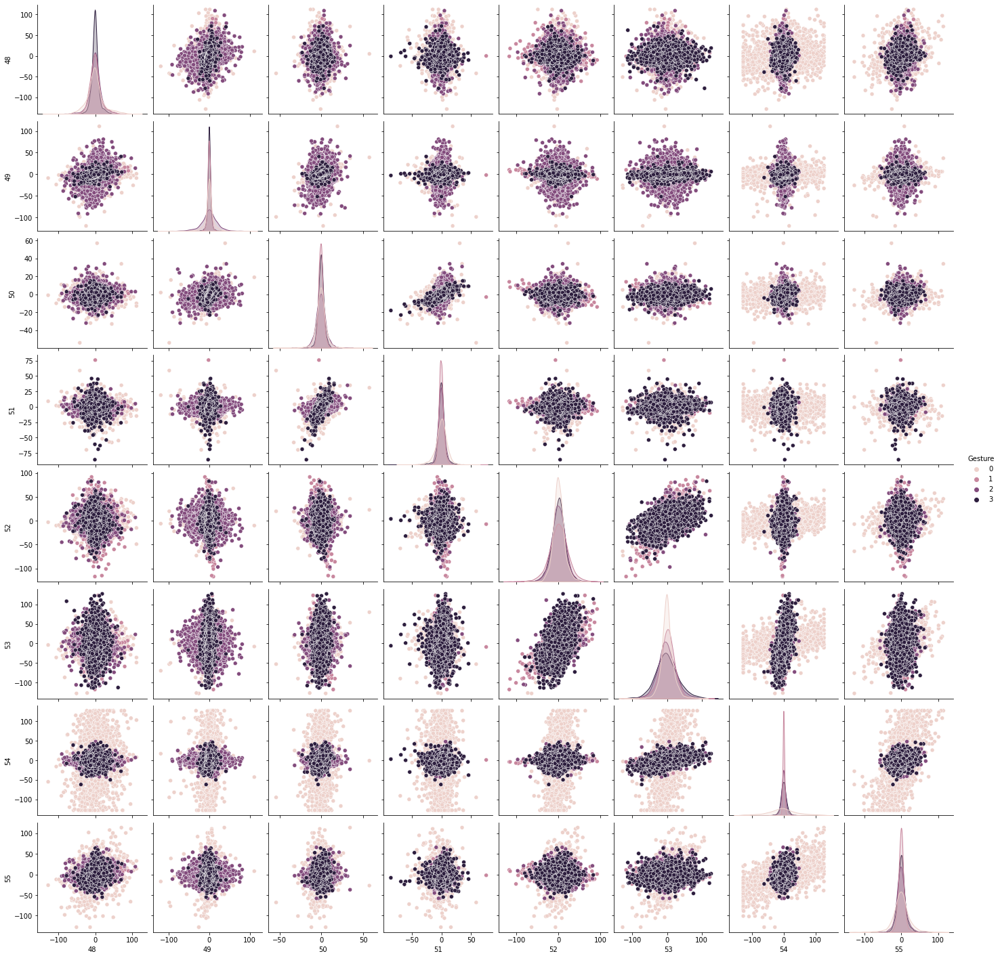

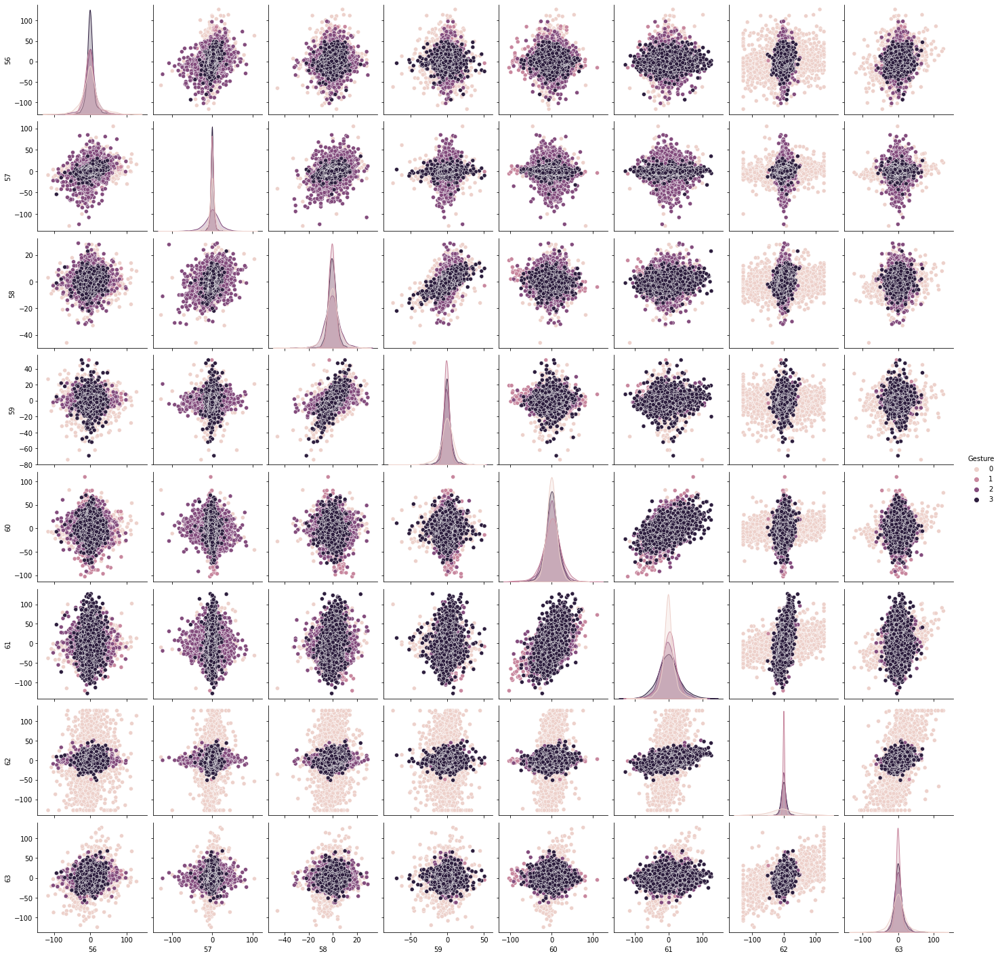

In [ ]:
# for i in range(8):
#  sns.pairplot(df[list(df.columns[8*i:8*(i+1)]) + [df.columns[-1]]], hue='Gesture')

#### JointPlots

This section shows the join-plots between the features that are correlated.

##### Sample: One of the joinplots with correlated features, between feature 0 and 8

Features: 0 and 8 are negatively correlated with correlation value as **-0.4**.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


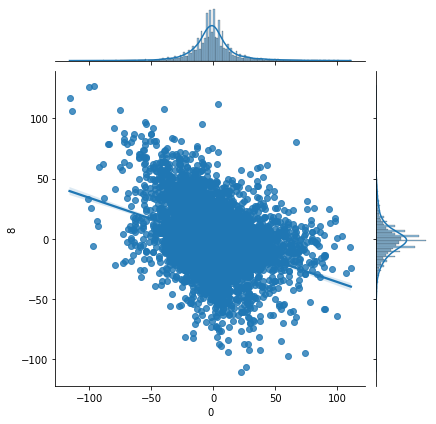

In [ ]:
sns.jointplot(df_features.loc[:,0],df_features.loc[:,8], kind='reg')

##### Picking correlation factor

This section defines a correlation value that is used for taking out features which are highly correlated.


In [ ]:
corr_factor = 0.5

##### Correlation Joinplots

This section plots the joinplots of all those features which have high correlation.

In [ ]:
df_features_corr = df_features.corr().to_numpy()
df_features_corr.shape
t = 0.3
corr_features = []
for i in range(df_features_corr.shape[0]):
  for j in range(df_features_corr.shape[1]):
    if i != j and abs(df_features_corr[i][j]) >= corr_factor:
      if (i, j) not in corr_features and (j, i) not in corr_features:
        corr_features.append((i,j))
print(f"There are {len(corr_features)} pairs of highly-correlated features.")

There are 12 pairs of highly-correlated features.


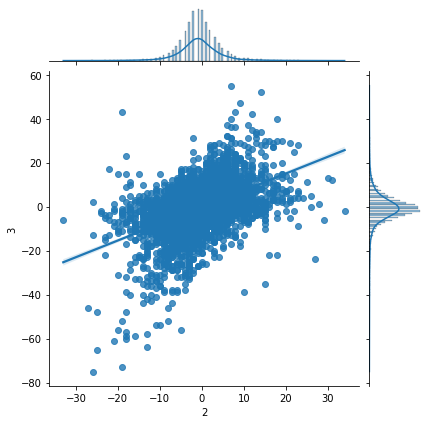

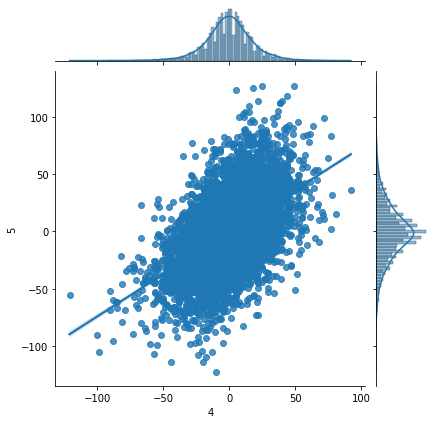

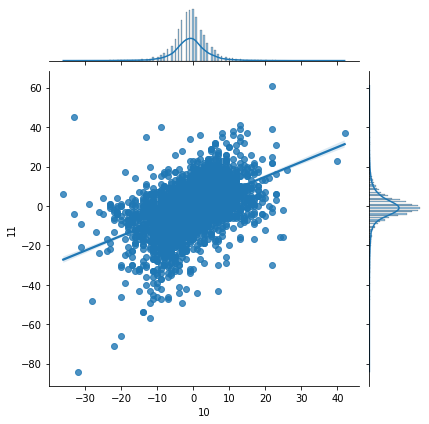

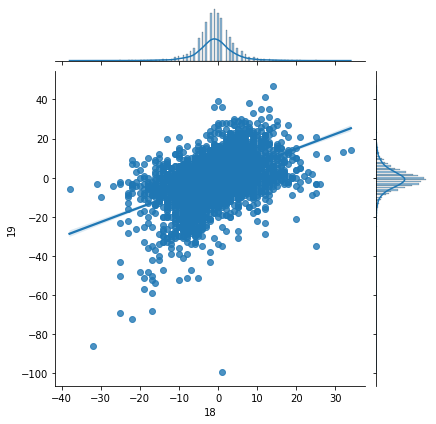

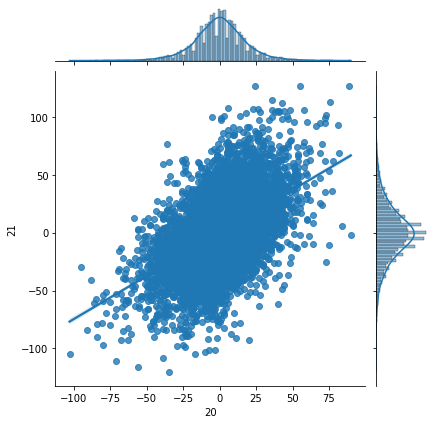

...

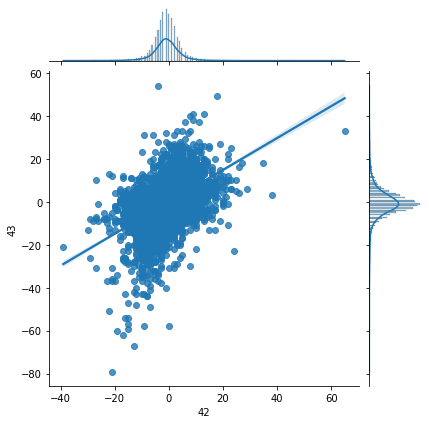

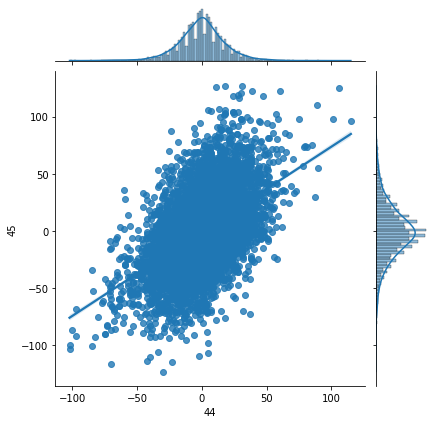

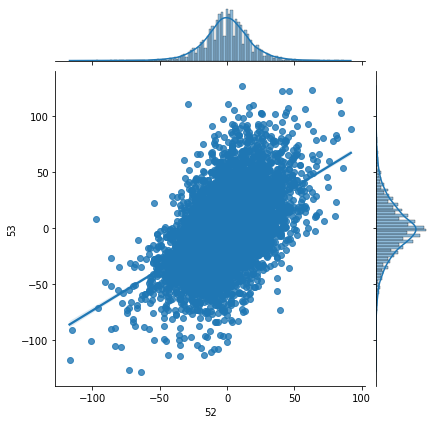

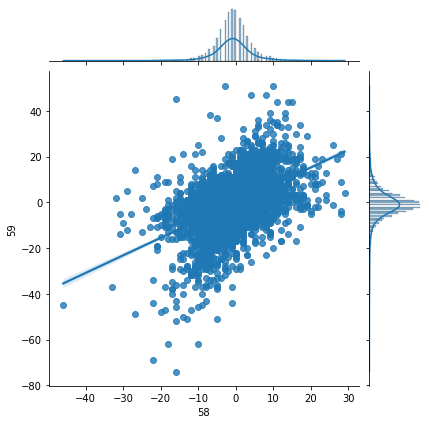

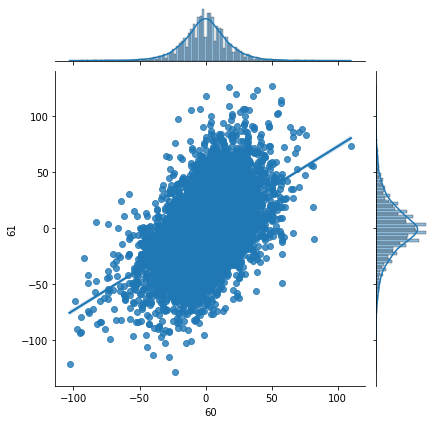

In [ ]:
# Plotting joinplots of all these pair of correlated features
rows = len(corr_features)//2 if len(corr_features) % 2 == 0 else (len(corr_features)+1)//2
cols=2
for row in range(rows):
  if 2*row+cols > len(corr_features):
    cols=1
  for col in range(cols):
    corr = corr_features[2*row + col]
    sns.jointplot(x=corr[0],y=corr[1], kind='reg',data=df)

#### Data PreProcessing

This section involves standardizing the data.
As all the features have different range of values, we must standardize the values to get a better and faster result.

In [ ]:
from sklearn.preprocessing import StandardScaler
s = StandardScaler()
df_features_scaled = s.fit_transform(df_features)
df_features_scaled = pd.DataFrame(df_features_scaled, columns=df_features.columns)

#### Selecting Features based on correlation

This section takes an alternate approach and eliminates one of the features from the pair of features that are highly-correlated.

In [ ]:
corr = df_features_scaled.corr()
columns = np.full((corr.shape[0],), True, dtype=bool)
eliminated_columns = []
for i in range(len(corr_features)):
    j = corr_features[i][1]
    eliminated_columns.append(j)
    if columns[j]:
        columns[j] = False
selected_columns = df_features_scaled.columns[columns]
print(f"The columns that have been eliminated are: {eliminated_columns}")
print(f"The selected columns are: {list(selected_columns)}")

The columns that have been eliminated are: [3, 5, 11, 19, 21, 29, 35, 43, 45, 53, 59, 61]
The selected columns are: [0, 1, 2, 4, 6, 7, 8, 9, 10, 12, 13, 14, 15, 16, 17, 18, 20, 22, 23, 24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 36, 37, 38, 39, 40, 41, 42, 44, 46, 47, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 60, 62, 63]


In [ ]:
df_features_selected_scaled = df_features_scaled[selected_columns]
print("The dataset with the selected features:")
df_features_selected_scaled

The dataset with the selected features:


,0,1,2,4,6,7,8,9,10,12,13,14,15,16,17,18,20,22,23,24,25,26,27,28,30,31,32,33,34,36,37,38,39,40,41,42,44,46,47,48,49,50,51,52,54,55,56,57,58,60,62,63
0,1.428445,0.401724,1.150179,-0.047110,-4.293826,-4.240470,-0.459858,0.224160,0.943401,-1.008376,-1.148141,-4.687136,-2.870915,0.977625,0.557215,-0.048305,1.500757,3.699334,4.773384,-1.435773,-0.023534,0.149168,0.229487,0.723839,-2.389018,-1.174740,1.688676,0.227592,0.553157,-1.280924,-0.030327,-3.133125,0.311949,-0.340106,-0.424570,-2.255355,-0.599384,-2.638500,-0.472078,-1.449747,0.152056,0.365672,1.863863,-0.445929,0.894454,-1.785637,3.396947,0.394898,1.764490,0.232428,-2.278454,1.069524
1,-2.503492,-0.448155,-0.853937,0.737220,1.445765,-0.606050,0.588529,-0.282565,0.144167,-1.732227,-1.263605,-1.859278,-3.325940,1.912308,0.892739,1.149371,1.278276,3.097846,3.306738,-1.492316,-0.525205,-1.262488,-0.317274,0.004883,-4.319109,-0.075906,-0.343681,0.639210,2.348314,0.114153,0.083539,3.089289,0.247008,0.428169,-0.095361,0.158967,1.169911,0.057639,-0.472078,-2.163987,-0.266033,-0.040793,0.913042,-0.108561,-4.087375,-1.587727,2.627872,0.561499,1.362038,0.736892,4.451912,1.005130
2,-0.995352,-0.618131,-1.455172,-1.167581,-3.098077,0.821758,0.036746,0.477522,0.943401,1.330217,0.352887,1.366869,2.264364,-0.012039,-0.281595,-0.447530,-0.390327,-3.358123,-0.759874,-0.531083,-0.107146,-0.455827,-0.180584,-0.437552,-0.577096,-1.368651,-1.134042,-0.513321,-1.441461,-0.778696,-0.675572,-2.973576,-2.805224,1.525705,0.645358,0.963741,-0.544093,5.168231,4.494404,-1.339863,-0.934976,-1.666650,0.233884,1.015999,-4.996756,-5.414002,0.430515,0.644800,0.355910,0.400583,4.570683,3.130128
3,0.135753,0.316736,0.148121,0.008913,4.275702,-0.865651,-0.846106,-0.113656,-0.455258,0.996132,0.814742,-0.305948,0.184251,-0.396908,0.053929,0.750146,-0.779667,0.571597,-0.826540,0.656322,-0.274370,-0.859158,-1.000725,-1.654248,-4.988732,-1.368651,-0.117864,-0.348673,-1.441461,1.397624,-0.333972,-1.058987,0.182066,-1.163258,0.727660,1.768514,0.119392,2.190406,1.333916,1.572041,-0.684123,-0.853721,-0.581105,-0.389701,-2.070920,-2.445340,-0.558296,0.394898,1.563264,1.857924,4.768635,2.808159
4,0.351202,0.061772,0.148121,-0.775416,-1.982046,0.367456,0.422994,0.055252,0.943401,0.717728,-0.609311,-1.739791,-0.400781,-4.575490,-0.617119,-0.447530,-2.003310,-5.082389,-3.626503,4.275083,0.310913,-1.464153,-1.547486,0.779143,3.480034,3.673054,-0.117864,0.227592,0.154234,0.225759,0.576962,-0.460678,0.052184,-0.779121,0.151545,0.762547,-0.101770,-2.155610,-1.504074,0.088618,0.486527,1.178601,0.369716,0.622403,2.436448,2.568400,-1.876710,-0.604712,0.557136,-0.720448,-4.376745,-4.403956
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11673,-0.133558,-0.023216,-0.052291,-1.559746,0.250017,0.042954,-0.239145,0.055252,0.543784,-0.562930,-0.647798,-0.066974,-0.075763,0.702719,0.221691,0.550533,-0.223466,0.090407,-0.359880,-0.248368,-0.023534,0.350833,0.092797,0.613230,-0.104421,0.958290,0.164408,-0.101703,-0.244690,-0.946106,0.045584,-0.021918,0.441831,-0.724244,-0.177663,-0.645807,1.501653,-0.183806,-1.052576,-0.186090,0.152056,-0.244025,0.233884,0.734859,-0.054466,-0.136381,0.100911,0.394898,0.758361,-2.850408,0.255331,-0.540323
11674,-0.672179,-0.363167,-0.653526,-0.215181,-0.347857,-0.476249,1.140311,0.815338,1.942442,0.272282,1.930891,1.287212,1.224307,-0.122001,-0.197714,0.350920,0.944556,-0.350684,-1.159869,-0.587626,-0.357982,-0.254162,-0.180584,0.557926,-0.025641,1.022927,0.333771,-0.101703,-0.244690,-0.332272,-1.890151,-0.580340,0.506772,-0.614490,-0.095361,-0.444614,1.169911,0.540530,-0.730077,-0.021265,0.319292,0.568904,0.777211,-0.670841,0.261841,0.457352,-0.118824,-0.188208,-0.448993,-0.215984,-0.417706,-0.926686
11675,-0.025833,-0.193191,-0.052291,1.689620,0.010867,2.379367,-0.515037,0.139706,0.943401,-0.173164,1.276597,-0.027145,-0.010760,-0.012039,0.221691

#### Model Testing

This section defines a standard way to test a model with selected features

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

def test_model(x, y, model, test_size=0.3, random_state=42):
  X_train, X_test, Y_train, Y_test = train_test_split(x, y, test_size=test_size, random_state=random_state)
  print(X_train.head())
  model.fit(X_train, Y_train)
  prediction = model.predict(X_test)

  accuracy = accuracy_score(Y_test, prediction)
  precision = precision_score(Y_test, prediction, average="weighted")
  recall = recall_score(Y_test, prediction, average="weighted")
  f1 = f1_score(Y_test, prediction, average="weighted")
  print("="*50)
  print(f"Model {model} Result with {x.shape[1]} Features: ")
  print("Accuracy : ",accuracy)
  print("Precision: ",precision)
  print("Recall   : ",recall)
  print("F1 Score : ",f1)
  print("="*50)
  return accuracy, precision, recall, f1

### Testing Classifiers

This section tests given models with the dataset.

In [ ]:
test_size = 0.3
random_state = 42
data = {'Model': [], 'Features': [] , 'Accuracy': [], 'Precision': [], 'Recall': [], 'F1_Score': [], 'columns': []}

def store_data(model, features, performance, columns):
  data['Model'].append(model)
  data['Features'].append(features)
  data['Accuracy'].append(performance[0])
  data['Precision'].append(performance[1])
  data['Recall'].append(performance[2])
  data['F1_Score'].append(performance[3])
  data['columns'].append(columns)

#### Linear SVC Model Classifier

This is the first classifier that we try to fit the features in.

In [ ]:
from sklearn.svm import LinearSVC

##### 4 Features

In [ ]:
columns = df_features_scaled.columns[0:4]
performance = test_model(df_features_scaled[columns], gestures, LinearSVC(), test_size, random_state)
store_data('LinearSVC', 4, performance, columns)

             0         1         2         3
2233  2.020928 -0.873095 -0.052291  2.382596
3050  0.351202  0.401724  1.150179  1.038755
7485 -0.079696 -0.873095  1.150179  0.904371
4447  0.566650  0.146760  0.548944  0.232451
400  -1.911009 -0.788107  0.148121  1.038755
Model LinearSVC() Result with 4 Features: 
Accuracy :  0.2054794520547945
Precision:  0.2396384441391281
Recall   :  0.2054794520547945
F1 Score :  0.17699294138184377


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


##### 8 Features

In [ ]:
columns = df_features_scaled.columns[0:8]
performance = test_model(df_features_scaled[columns], gestures, LinearSVC(), test_size, random_state)
store_data('LinearSVC', 8, performance, columns)

             0         1         2  ...         5         6         7
2233  2.020928 -0.873095 -0.052291  ...  0.486465  0.289875  0.627057
3050  0.351202  0.401724  1.150179  ... -1.722116  0.010867  0.302555
7485 -0.079696 -0.873095  1.150179  ...  1.261406  0.050726  0.562157
4447  0.566650  0.146760  0.548944  ... -0.443464  0.010867  0.172755
400  -1.911009 -0.788107  0.148121  ... -0.327223 -0.786298 -0.865651

[5 rows x 8 columns]
Model LinearSVC() Result with 8 Features: 
Accuracy :  0.3167808219178082
Precision:  0.3221054957181495
Recall   :  0.3167808219178082
F1 Score :  0.30031555027747875


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


##### 16 Features

In [ ]:
columns = df_features_scaled.columns[0:16]
performance = test_model(df_features_scaled[columns], gestures, LinearSVC(), test_size, random_state)
store_data('LinearSVC', 16, performance, columns)

            0         1         2   ...        13        14        15
2233  2.020928 -0.873095 -0.052291  ...  0.006496  1.486356  0.184251
3050  0.351202  0.401724  1.150179  ...  0.429863  0.132171  1.614329
7485 -0.079696 -0.873095  1.150179  ... -0.070480 -0.186461 -0.855806
4447  0.566650  0.146760  0.548944  ... -0.147456 -0.066974 -0.270774
400  -1.911009 -0.788107  0.148121  ... -0.686286 -3.332951 -2.025869

[5 rows x 16 columns]
Model LinearSVC() Result with 16 Features: 
Accuracy :  0.3062214611872146
Precision:  0.3145964483880053
Recall   :  0.3062214611872146
F1 Score :  0.29613919990573323


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


##### 24 Features

In [ ]:
columns = df_features_scaled.columns[0:24]
performance = test_model(df_features_scaled[columns], gestures, LinearSVC(), test_size, random_state)
store_data('LinearSVC', 24, performance, columns)

            0         1         2   ...        21        22        23
2233  2.020928 -0.873095 -0.052291  ... -0.031200 -0.270486  0.640107
3050  0.351202  0.401724  1.150179  ... -0.731724  0.090407 -0.093217
7485 -0.079696 -0.873095  1.150179  ... -0.264708  0.170605  1.640093
4447  0.566650  0.146760  0.548944  ...  0.007718  0.090407  0.106781
400  -1.911009 -0.788107  0.148121  ...  0.902833  4.421119  5.040048

[5 rows x 24 columns]
Model LinearSVC() Result with 24 Features: 
Accuracy :  0.3193493150684932
Precision:  0.3220676392206067
Recall   :  0.3193493150684932
F1 Score :  0.3096887340012854


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


##### 32 Features

In [ ]:
columns = df_features_scaled.columns[0:32]
performance = test_model(df_features_scaled[columns], gestures, LinearSVC(), test_size, random_state)
store_data('LinearSVC', 32, performance, columns)

            0         1         2   ...        29        30        31
2233  2.020928 -0.873095 -0.052291  ... -0.787989 -3.373758 -2.790671
3050  0.351202  0.401724  1.150179  ... -0.022318 -0.025641  0.441192
7485 -0.079696 -0.873095  1.150179  ...  1.279322  0.486424  0.311917
4447  0.566650  0.146760  0.548944  ...  0.283950  0.250086  0.699741
400  -1.911009 -0.788107  0.148121  ...  1.585590  2.810410  2.574221

[5 rows x 32 columns]
Model LinearSVC() Result with 32 Features: 
Accuracy :  0.322203196347032
Precision:  0.32535365465285165
Recall   :  0.322203196347032
F1 Score :  0.31798104510154035


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


##### 40 Features

In [ ]:
columns = df_features_scaled.columns[0:40]
performance = test_model(df_features_scaled[columns], gestures, LinearSVC(), test_size, random_state)
store_data('LinearSVC', 40, performance, columns)

            0         1         2   ...        37        38        39
2233  2.020928 -0.873095 -0.052291  ...  0.159450  0.656166  2.130300
3050  0.351202  0.401724  1.150179  ...  1.677674 -0.021918 -1.051815
7485 -0.079696 -0.873095  1.150179  ...  0.197406 -0.101692 -0.337462
4447  0.566650  0.146760  0.548944  ...  0.766740  0.137631 -0.597227
400  -1.911009 -0.788107  0.148121  ...  0.728784 -1.856732 -1.116756

[5 rows x 40 columns]
Model LinearSVC() Result with 40 Features: 
Accuracy :  0.3339041095890411
Precision:  0.3371004386365188
Recall   :  0.3339041095890411
F1 Score :  0.3318245318346942


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


##### 48 Features


In [ ]:
columns = df_features_scaled.columns[0:48]
performance = test_model(df_features_scaled[columns], gestures, LinearSVC(), test_size, random_state)
store_data('LinearSVC', 48, performance, columns)

            0         1         2   ...        45        46        47
2233  2.020928 -0.873095 -0.052291  ... -0.286408  1.466070  0.237420
3050  0.351202  0.401724  1.150179  ... -1.776939 -0.022843 -0.214079
7485 -0.079696 -0.873095  1.150179  ... -0.936127  0.017398 -0.278578
4447  0.566650  0.146760  0.548944  ... -0.974345 -0.022843  0.430919
400  -1.911009 -0.788107  0.148121  ...  0.707279  0.822216  2.365912

[5 rows x 48 columns]
Model LinearSVC() Result with 48 Features: 
Accuracy :  0.353310502283105
Precision:  0.35696779625182457
Recall   :  0.353310502283105
F1 Score :  0.353363149713939


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


##### 56 Features

In [ ]:
columns = df_features_scaled.columns[0:56]
performance = test_model(df_features_scaled[columns], gestures, LinearSVC(), test_size, random_state)
store_data('LinearSVC', 56, performance, columns)

            0         1         2   ...        53        54        55
2233  2.020928 -0.873095 -0.052291  ...  0.631141  0.696762 -0.202351
3050  0.351202  0.401724  1.150179  ... -0.101552 -0.014928  0.259441
7485 -0.079696 -0.873095  1.150179  ... -0.371491 -0.370772 -1.059964
4447  0.566650  0.146760  0.548944  ... -0.911370 -0.014928 -0.598173
400  -1.911009 -0.788107  0.148121  ... -0.949932 -3.652453 -2.445340

[5 rows x 56 columns]
Model LinearSVC() Result with 56 Features: 
Accuracy :  0.341324200913242
Precision:  0.3416270142535237
Recall   :  0.341324200913242
F1 Score :  0.3393969505552646


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


##### 64 Features

In [ ]:
columns = df_features_scaled.columns[0:64]
performance = test_model(df_features_scaled[columns], gestures, LinearSVC(), test_size, random_state)
store_data('LinearSVC', 64, performance, columns)

            0         1         2   ...        61        62        63
2233  2.020928 -0.873095 -0.052291  ... -0.024469 -0.140573  1.005130
3050  0.351202  0.401724  1.150179  ... -0.298442  0.017788 -0.089566
7485 -0.079696 -0.873095  1.150179  ...  0.640893 -0.219754  1.069524
4447  0.566650  0.146760  0.548944  ... -0.102747 -0.061393 -0.411535
400  -1.911009 -0.788107  0.148121  ... -1.120360 -2.080503 -1.956988

[5 rows x 64 columns]
Model LinearSVC() Result with 64 Features: 
Accuracy :  0.3378995433789954
Precision:  0.34357373491484183
Recall   :  0.3378995433789954
F1 Score :  0.33915055692984664


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


##### Selected Features, based on correlation



In [ ]:
performance = test_model(df_features_selected_scaled, gestures, LinearSVC(), test_size, random_state)
store_data('LinearSVC', df_features_selected_scaled.shape[1], performance, columns)

            0         1         2   ...        60        62        63
2233  2.020928 -0.873095 -0.052291  ...  0.680841 -0.140573  1.005130
3050  0.351202  0.401724  1.150179  ... -0.047830  0.017788 -0.089566
7485 -0.079696 -0.873095  1.150179  ...  0.736892 -0.219754  1.069524
4447  0.566650  0.146760  0.548944  ...  0.905047 -0.061393 -0.411535
400  -1.911009 -0.788107  0.148121  ... -0.552294 -2.080503 -1.956988

[5 rows x 52 columns]
Model LinearSVC() Result with 52 Features: 
Accuracy :  0.336472602739726
Precision:  0.33650471266740756
Recall   :  0.336472602739726
F1 Score :  0.33508087154435195


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


#### Test

In [ ]:
df_features_copy = pd.DataFrame(df_features_scaled,columns=df_features.columns)
df_features_copy

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63
0,1.428445,0.401724,1.150179,1.173139,-0.047110,-0.482211,-4.293826,-4.240470,-0.459858,0.224160,0.943401,1.860780,-1.008376,-1.148141,-4.687136,-2.870915,0.977625,0.557215,-0.048305,-1.118587,1.500757,0.786079,3.699334,4.773384,-1.435773,-0.023534,0.149168,0.229487,0.723839,0.781636,-2.389018,-1.174740,1.688676,0.227592,0.553157,0.089155,-1.280924,-0.030327,-3.133125,0.311949,-0.340106,-0.424570,-2.255355,-3.587575,-0.599384,-0.592158,-2.638500,-0.472078,-1.449747,0.152056,0.365672,1.863863,-0.445929,-0.410054,0.894454,-1.785637,3.396947,0.394898,1.764490,0.772653,0.232428,-0.259303,-2.278454,1.069524
1,-2.503492,-0.448155,-0.853937,-0.842622,0.737220,-0.017247,1.445765,-0.606050,0.588529,-0.282565,0.144167,1.047392,-1.732227,-1.263605,-1.859278,-3.325940,1.912308,0.892739,1.149371,-1.118587,1.278276,2.459553,3.097846,3.306738,-1.492316,-0.525205,-1.262488,-0.317274,0.004883,0.169099,-4.319109,-0.075906,-0.343681,0.639210,2.348314,1.589369,0.114153,0.083539,3.089289,0.247008,0.428169,-0.095361,0.158967,-0.728748,1.169911,-0.095314,0.057639,-0.472078,-2.163987,-0.266033,-0.040793,0.913042,-0.108561,-0.062989,-4.087375,-1.587727,2.627872,0.561499,1.362038,0.772653,0.736892,0.836588,4.451912,1.005130
2,-0.995352,-0.618131,-1.455172,-0.977006,-1.167581,-0.210982,-3.098077,0.821758,0.036746,0.477522,0.943401,2.267474,1.330217,0.352887,1.366869,2.264364,-0.012039,-0.281595,-0.447530,-0.712677,-0.390327,-0.420380,-3.358123,-0.759874,-0.531083,-0.107146,-0.455827,-0.180584,-0.437552,-1.132541,-0.577096,-1.368651,-1.134042,-0.513321,-1.441461,-1.547443,-0.778696,-0.675572,-2.973576,-2.805224,1.525705,0.645358,0.963741,-0.456479,-0.544093,0.898373,5.168231,4.494404,-1.339863,-0.934976,-1.666650,0.233884,1.015999,-1.258434,-4.996756,-5.414002,0.430515,0.644800,0.355910,-0.987888,0.400583,0.836588,4.570683,3.130128
3,0.135753,0.316736,0.148121,0.366835,0.008913,0.873935,4.275702,-0.865651,-0.846106,-0.113656,-0.455258,-0.443818,0.996132,0.814742,-0.305948,0.184251,-0.396908,0.053929,0.750146,0.775659,-0.779667,-0.576052,0.571597,-0.826540,0.656322,-0.274370,-0.859158,-1.000725,-1.654248,-1.017690,-4.988732,-1.368651,-0.117864,-0.348673,-1.441461,0.089155,1.397624,-0.333972,-1.058987,0.182066,-1.163258,0.727660,1.768514,-0.184210,0.119392,0.477967,2.190406,1.333916,1.572041,-0.684123,-0.853721,-0.581105,-0.389701,-0.255803,-2.070920,-2.445340,-0.558296,0.394898,1.563264,1.585211,1.857924,1.541089,4.768635,2.808159
4,0.351202,0.061772,0.148121,-0.170702,-0.775416,0.408971,-1.982046,0.367456,0.422994,0.055252,0.943401,1.860780,0.717728,-0.609311,-1.739791,-0.400781,-4.575490,-0.617119,-0.447530,-0.442070,-2.003310,-1.004150,-5.082389,-3.626503,4.275083,0.310913,-1.464153,-1.547486,0.779143,0.475368,3.480034,3.673054,-0.117864,0.227592,0.154234,-0.865527,0.225759,0.576962,-0.460678,0.052184,-0.779121,0.151545,0.762547,1.177137,-0.101770,-0.209971,-2.155610,-1.504074,0.088618,0.486527,1.178601,0.369716,0.622403,0.476890,2.436448,2.568400,-1.876710,-0.604712,0.557136,0.908079,-0.720448,-0.924666,-4.376745,-4.403956
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11673,-0.133558,-0.023216,-0.052291,-0.036318,-1.559746,0.796441,0.250017,0.042954,-0.239145,0.055252,0.543784,0.776263,-0.562930,-0.647798,-0.066974,-0.075763,0.702719,0.221691,0.550533,0.369749,-0.223466,-1.081986,0.090407,-0.359880,-0.248368,-0.023534,0.350833,0.092797,0.613230,0.360517,-0.104421,0.958290,0.164408,-0.101703,-0.244690,-1.001910,-0.946106,0.045584,-0.021918,0.441831,-0.724244,-0.177663,-0.645807,-0.184210,1.501653,0.707279,-0.183806,-1.052576,-0.186090,0.152056,-0.244025,0.233884,

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(df_features_copy,gestures, test_size=0.3, random_state=42)

In [ ]:
from sklearn.svm import SVC
from sklearn.metrics import classification_report
svc= SVC()
svc.fit(X_train,Y_train)
prediction=svc.predict(X_test)
print("SVC Result: ")
print("Accuracy : ",accuracy_score(Y_test, prediction))
print("Precision: ",precision_score(Y_test, prediction, average="weighted"))
print("Recall   : ",recall_score(Y_test, prediction, average="weighted"))
print("F1 Score : ",f1_score(Y_test, prediction, average="weighted"))

SVC Result: 
Accuracy :  0.889269406392694
Precision:  0.8902840584350628
Recall   :  0.889269406392694
F1 Score :  0.8885080620224877


#### Logistic regression

In [ ]:
from sklearn.linear_model import LogisticRegression

##### 4 Features

In [ ]:
columns = df_features_scaled.columns[0:4]
performance = test_model(df_features_scaled[columns], gestures, LogisticRegression(), test_size, random_state)
store_data('LogisticRegression', 4, performance, columns)

             0         1         2         3
2233  2.020928 -0.873095 -0.052291  2.382596
3050  0.351202  0.401724  1.150179  1.038755
7485 -0.079696 -0.873095  1.150179  0.904371
4447  0.566650  0.146760  0.548944  0.232451
400  -1.911009 -0.788107  0.148121  1.038755
Model LogisticRegression() Result with 4 Features: 
Accuracy :  0.2071917808219178
Precision:  0.24165174438442785
Recall   :  0.2071917808219178
F1 Score :  0.17928012739306654


##### 8 Features

In [ ]:
columns = df_features_scaled.columns[0:8]
performance = test_model(df_features_scaled[columns], gestures, LogisticRegression(), test_size, random_state)
store_data('LogisticRegression', 8, performance, columns)

             0         1         2  ...         5         6         7
2233  2.020928 -0.873095 -0.052291  ...  0.486465  0.289875  0.627057
3050  0.351202  0.401724  1.150179  ... -1.722116  0.010867  0.302555
7485 -0.079696 -0.873095  1.150179  ...  1.261406  0.050726  0.562157
4447  0.566650  0.146760  0.548944  ... -0.443464  0.010867  0.172755
400  -1.911009 -0.788107  0.148121  ... -0.327223 -0.786298 -0.865651

[5 rows x 8 columns]
Model LogisticRegression() Result with 8 Features: 
Accuracy :  0.3176369863013699
Precision:  0.3251403153773916
Recall   :  0.3176369863013699
F1 Score :  0.30271463052404807


##### 16 Features

In [ ]:
columns = df_features_scaled.columns[0:16]
performance = test_model(df_features_scaled[columns], gestures, LogisticRegression(), test_size, random_state)
store_data('LogisticRegression', 16, performance, columns)

            0         1         2   ...        13        14        15
2233  2.020928 -0.873095 -0.052291  ...  0.006496  1.486356  0.184251
3050  0.351202  0.401724  1.150179  ...  0.429863  0.132171  1.614329
7485 -0.079696 -0.873095  1.150179  ... -0.070480 -0.186461 -0.855806
4447  0.566650  0.146760  0.548944  ... -0.147456 -0.066974 -0.270774
400  -1.911009 -0.788107  0.148121  ... -0.686286 -3.332951 -2.025869

[5 rows x 16 columns]
Model LogisticRegression() Result with 16 Features: 
Accuracy :  0.3113584474885845
Precision:  0.3208745043747187
Recall   :  0.3113584474885845
F1 Score :  0.3036353144852318


##### 24 Features

In [ ]:
columns = df_features_scaled.columns[0:24]
performance = test_model(df_features_scaled[columns], gestures, LogisticRegression(), test_size, random_state)
store_data('LogisticRegression', 24, performance, columns)

            0         1         2   ...        21        22        23
2233  2.020928 -0.873095 -0.052291  ... -0.031200 -0.270486  0.640107
3050  0.351202  0.401724  1.150179  ... -0.731724  0.090407 -0.093217
7485 -0.079696 -0.873095  1.150179  ... -0.264708  0.170605  1.640093
4447  0.566650  0.146760  0.548944  ...  0.007718  0.090407  0.106781
400  -1.911009 -0.788107  0.148121  ...  0.902833  4.421119  5.040048

[5 rows x 24 columns]
Model LogisticRegression() Result with 24 Features: 
Accuracy :  0.3216324200913242
Precision:  0.3230814249756991
Recall   :  0.3216324200913242
F1 Score :  0.31420424010131676


##### 32 Features

In [ ]:
columns = df_features_scaled.columns[0:32]
performance = test_model(df_features_scaled[columns], gestures, LogisticRegression(), test_size, random_state)
store_data('LogisticRegression', 32, performance, columns)

            0         1         2   ...        29        30        31
2233  2.020928 -0.873095 -0.052291  ... -0.787989 -3.373758 -2.790671
3050  0.351202  0.401724  1.150179  ... -0.022318 -0.025641  0.441192
7485 -0.079696 -0.873095  1.150179  ...  1.279322  0.486424  0.311917
4447  0.566650  0.146760  0.548944  ...  0.283950  0.250086  0.699741
400  -1.911009 -0.788107  0.148121  ...  1.585590  2.810410  2.574221

[5 rows x 32 columns]
Model LogisticRegression() Result with 32 Features: 
Accuracy :  0.3239155251141553
Precision:  0.3278768067928202
Recall   :  0.3239155251141553
F1 Score :  0.32175475812078885


##### 40 Features

In [ ]:
columns = df_features_scaled.columns[0:40]
performance = test_model(df_features_scaled[columns], gestures, LogisticRegression(), test_size, random_state)
store_data('LogisticRegression', 40, performance, columns)

            0         1         2   ...        37        38        39
2233  2.020928 -0.873095 -0.052291  ...  0.159450  0.656166  2.130300
3050  0.351202  0.401724  1.150179  ...  1.677674 -0.021918 -1.051815
7485 -0.079696 -0.873095  1.150179  ...  0.197406 -0.101692 -0.337462
4447  0.566650  0.146760  0.548944  ...  0.766740  0.137631 -0.597227
400  -1.911009 -0.788107  0.148121  ...  0.728784 -1.856732 -1.116756

[5 rows x 40 columns]
Model LogisticRegression() Result with 40 Features: 
Accuracy :  0.3347602739726027
Precision:  0.3412492534367952
Recall   :  0.3347602739726027
F1 Score :  0.33512407399357513


##### 48 Features

In [ ]:
columns = df_features_scaled.columns[0:48]
performance = test_model(df_features_scaled[columns], gestures, LogisticRegression(), test_size, random_state)
store_data('LogisticRegression', 48, performance, columns)

            0         1         2   ...        45        46        47
2233  2.020928 -0.873095 -0.052291  ... -0.286408  1.466070  0.237420
3050  0.351202  0.401724  1.150179  ... -1.776939 -0.022843 -0.214079
7485 -0.079696 -0.873095  1.150179  ... -0.936127  0.017398 -0.278578
4447  0.566650  0.146760  0.548944  ... -0.974345 -0.022843  0.430919
400  -1.911009 -0.788107  0.148121  ...  0.707279  0.822216  2.365912

[5 rows x 48 columns]
Model LogisticRegression() Result with 48 Features: 
Accuracy :  0.3518835616438356
Precision:  0.35950481029585235
Recall   :  0.3518835616438356
F1 Score :  0.35364394760452983


##### 56 Features

In [ ]:
columns = df_features_scaled.columns[0:56]
performance = test_model(df_features_scaled[columns], gestures, LogisticRegression(), test_size, random_state)
store_data('LogisticRegression', 56, performance, columns)

            0         1         2   ...        53        54        55
2233  2.020928 -0.873095 -0.052291  ...  0.631141  0.696762 -0.202351
3050  0.351202  0.401724  1.150179  ... -0.101552 -0.014928  0.259441
7485 -0.079696 -0.873095  1.150179  ... -0.371491 -0.370772 -1.059964
4447  0.566650  0.146760  0.548944  ... -0.911370 -0.014928 -0.598173
400  -1.911009 -0.788107  0.148121  ... -0.949932 -3.652453 -2.445340

[5 rows x 56 columns]
Model LogisticRegression() Result with 56 Features: 
Accuracy :  0.3438926940639269
Precision:  0.34859812235991583
Recall   :  0.3438926940639269
F1 Score :  0.3444221395331536


##### 64 Features

In [ ]:
columns = df_features_scaled.columns[0:64]
performance = test_model(df_features_scaled[columns], gestures, LogisticRegression(), test_size, random_state)
store_data('LogisticRegression', 64, performance, columns)

            0         1         2   ...        61        62        63
2233  2.020928 -0.873095 -0.052291  ... -0.024469 -0.140573  1.005130
3050  0.351202  0.401724  1.150179  ... -0.298442  0.017788 -0.089566
7485 -0.079696 -0.873095  1.150179  ...  0.640893 -0.219754  1.069524
4447  0.566650  0.146760  0.548944  ... -0.102747 -0.061393 -0.411535
400  -1.911009 -0.788107  0.148121  ... -1.120360 -2.080503 -1.956988

[5 rows x 64 columns]
Model LogisticRegression() Result with 64 Features: 
Accuracy :  0.336472602739726
Precision:  0.34567745017042356
Recall   :  0.336472602739726
F1 Score :  0.339562711240151


##### Selected Features, based on correlation



In [ ]:
performance = test_model(df_features_selected_scaled, gestures, LogisticRegression(), test_size, random_state)
store_data('LogisticRegression', df_features_selected_scaled.shape[1], performance, columns)

            0         1         2   ...        60        62        63
2233  2.020928 -0.873095 -0.052291  ...  0.680841 -0.140573  1.005130
3050  0.351202  0.401724  1.150179  ... -0.047830  0.017788 -0.089566
7485 -0.079696 -0.873095  1.150179  ...  0.736892 -0.219754  1.069524
4447  0.566650  0.146760  0.548944  ...  0.905047 -0.061393 -0.411535
400  -1.911009 -0.788107  0.148121  ... -0.552294 -2.080503 -1.956988

[5 rows x 52 columns]
Model LogisticRegression() Result with 52 Features: 
Accuracy :  0.3387557077625571
Precision:  0.34489676643022327
Recall   :  0.3387557077625571
F1 Score :  0.3407250350330999


#### K-Nearest Neighbors Classifier

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
nearest_neighbors = 5

##### 4 Features

In [ ]:
columns = df_features_scaled.columns[0:4]
performance = test_model(df_features_scaled[columns], gestures, KNeighborsClassifier(n_neighbors=nearest_neighbors), test_size, random_state)
store_data('KNearestNeighbors', 4, performance, columns)

             0         1         2         3
2233  2.020928 -0.873095 -0.052291  2.382596
3050  0.351202  0.401724  1.150179  1.038755
7485 -0.079696 -0.873095  1.150179  0.904371
4447  0.566650  0.146760  0.548944  0.232451
400  -1.911009 -0.788107  0.148121  1.038755
Model KNeighborsClassifier() Result with 4 Features: 
Accuracy :  0.4694634703196347
Precision:  0.4721592878811158
Recall   :  0.4694634703196347
F1 Score :  0.46940832291208484


##### 8 Features

In [ ]:
columns = df_features_scaled.columns[0:8]
performance = test_model(df_features_scaled[columns], gestures, KNeighborsClassifier(n_neighbors=nearest_neighbors), test_size, random_state)
store_data('KNearestNeighbors', 8, performance, columns)

             0         1         2  ...         5         6         7
2233  2.020928 -0.873095 -0.052291  ...  0.486465  0.289875  0.627057
3050  0.351202  0.401724  1.150179  ... -1.722116  0.010867  0.302555
7485 -0.079696 -0.873095  1.150179  ...  1.261406  0.050726  0.562157
4447  0.566650  0.146760  0.548944  ... -0.443464  0.010867  0.172755
400  -1.911009 -0.788107  0.148121  ... -0.327223 -0.786298 -0.865651

[5 rows x 8 columns]
Model KNeighborsClassifier() Result with 8 Features: 
Accuracy :  0.6349885844748858
Precision:  0.6536837191558597
Recall   :  0.6349885844748858
F1 Score :  0.634392941333331


##### 16 Features

In [ ]:
columns = df_features_scaled.columns[0:16]
performance = test_model(df_features_scaled[columns], gestures, KNeighborsClassifier(n_neighbors=nearest_neighbors), test_size, random_state)
store_data('KNearestNeighbors', 16, performance, columns)

            0         1         2   ...        13        14        15
2233  2.020928 -0.873095 -0.052291  ...  0.006496  1.486356  0.184251
3050  0.351202  0.401724  1.150179  ...  0.429863  0.132171  1.614329
7485 -0.079696 -0.873095  1.150179  ... -0.070480 -0.186461 -0.855806
4447  0.566650  0.146760  0.548944  ... -0.147456 -0.066974 -0.270774
400  -1.911009 -0.788107  0.148121  ... -0.686286 -3.332951 -2.025869

[5 rows x 16 columns]
Model KNeighborsClassifier() Result with 16 Features: 
Accuracy :  0.6837899543378996
Precision:  0.7106667182774712
Recall   :  0.6837899543378996
F1 Score :  0.6826017303138593


##### 24 Features

In [ ]:
columns = df_features_scaled.columns[0:24]
performance = test_model(df_features_scaled[columns], gestures, KNeighborsClassifier(n_neighbors=nearest_neighbors), test_size, random_state)
store_data('KNearestNeighbors', 24, performance, columns)

            0         1         2   ...        21        22        23
2233  2.020928 -0.873095 -0.052291  ... -0.031200 -0.270486  0.640107
3050  0.351202  0.401724  1.150179  ... -0.731724  0.090407 -0.093217
7485 -0.079696 -0.873095  1.150179  ... -0.264708  0.170605  1.640093
4447  0.566650  0.146760  0.548944  ...  0.007718  0.090407  0.106781
400  -1.911009 -0.788107  0.148121  ...  0.902833  4.421119  5.040048

[5 rows x 24 columns]
Model KNeighborsClassifier() Result with 24 Features: 
Accuracy :  0.7003424657534246
Precision:  0.7341300159833243
Recall   :  0.7003424657534246
F1 Score :  0.6979208382606802


##### 32 Features

In [ ]:
columns = df_features_scaled.columns[0:32]
performance = test_model(df_features_scaled[columns], gestures, KNeighborsClassifier(n_neighbors=nearest_neighbors), test_size, random_state)
store_data('KNearestNeighbors', 32, performance, columns)

            0         1         2   ...        29        30        31
2233  2.020928 -0.873095 -0.052291  ... -0.787989 -3.373758 -2.790671
3050  0.351202  0.401724  1.150179  ... -0.022318 -0.025641  0.441192
7485 -0.079696 -0.873095  1.150179  ...  1.279322  0.486424  0.311917
4447  0.566650  0.146760  0.548944  ...  0.283950  0.250086  0.699741
400  -1.911009 -0.788107  0.148121  ...  1.585590  2.810410  2.574221

[5 rows x 32 columns]
Model KNeighborsClassifier() Result with 32 Features: 
Accuracy :  0.6880707762557078
Precision:  0.7288181892640859
Recall   :  0.6880707762557078
F1 Score :  0.6821147093869252


##### 40 Features

In [ ]:
columns = df_features_scaled.columns[0:40]
performance = test_model(df_features_scaled[columns], gestures, KNeighborsClassifier(n_neighbors=nearest_neighbors), test_size, random_state)
store_data('KNearestNeighbors', 40, performance, columns)

            0         1         2   ...        37        38        39
2233  2.020928 -0.873095 -0.052291  ...  0.159450  0.656166  2.130300
3050  0.351202  0.401724  1.150179  ...  1.677674 -0.021918 -1.051815
7485 -0.079696 -0.873095  1.150179  ...  0.197406 -0.101692 -0.337462
4447  0.566650  0.146760  0.548944  ...  0.766740  0.137631 -0.597227
400  -1.911009 -0.788107  0.148121  ...  0.728784 -1.856732 -1.116756

[5 rows x 40 columns]
Model KNeighborsClassifier() Result with 40 Features: 
Accuracy :  0.6934931506849316
Precision:  0.742938320807401
Recall   :  0.6934931506849316
F1 Score :  0.6868268041305878


##### 48 Features

In [ ]:
columns = df_features_scaled.columns[0:48]
performance = test_model(df_features_scaled[columns], gestures, KNeighborsClassifier(n_neighbors=nearest_neighbors), test_size, random_state)
store_data('KNearestNeighbors', 48, performance, columns)

            0         1         2   ...        45        46        47
2233  2.020928 -0.873095 -0.052291  ... -0.286408  1.466070  0.237420
3050  0.351202  0.401724  1.150179  ... -1.776939 -0.022843 -0.214079
7485 -0.079696 -0.873095  1.150179  ... -0.936127  0.017398 -0.278578
4447  0.566650  0.146760  0.548944  ... -0.974345 -0.022843  0.430919
400  -1.911009 -0.788107  0.148121  ...  0.707279  0.822216  2.365912

[5 rows x 48 columns]
Model KNeighborsClassifier() Result with 48 Features: 
Accuracy :  0.684931506849315
Precision:  0.7387530340547428
Recall   :  0.684931506849315
F1 Score :  0.6748050723610802


##### 56 Features

In [ ]:
columns = df_features_scaled.columns[0:56]
performance = test_model(df_features_scaled[columns], gestures, KNeighborsClassifier(n_neighbors=nearest_neighbors), test_size, random_state)
store_data('KNearestNeighbors', 56, performance, columns)

            0         1         2   ...        53        54        55
2233  2.020928 -0.873095 -0.052291  ...  0.631141  0.696762 -0.202351
3050  0.351202  0.401724  1.150179  ... -0.101552 -0.014928  0.259441
7485 -0.079696 -0.873095  1.150179  ... -0.371491 -0.370772 -1.059964
4447  0.566650  0.146760  0.548944  ... -0.911370 -0.014928 -0.598173
400  -1.911009 -0.788107  0.148121  ... -0.949932 -3.652453 -2.445340

[5 rows x 56 columns]
Model KNeighborsClassifier() Result with 56 Features: 
Accuracy :  0.6766552511415526
Precision:  0.7361443002504187
Recall   :  0.6766552511415526
F1 Score :  0.6635432012546532


##### 64 Features

In [ ]:
columns = df_features_scaled.columns[0:64]
performance = test_model(df_features_scaled[columns], gestures, KNeighborsClassifier(n_neighbors=nearest_neighbors), test_size, random_state)
store_data('KNearestNeighbors', 64, performance, columns)

            0         1         2   ...        61        62        63
2233  2.020928 -0.873095 -0.052291  ... -0.024469 -0.140573  1.005130
3050  0.351202  0.401724  1.150179  ... -0.298442  0.017788 -0.089566
7485 -0.079696 -0.873095  1.150179  ...  0.640893 -0.219754  1.069524
4447  0.566650  0.146760  0.548944  ... -0.102747 -0.061393 -0.411535
400  -1.911009 -0.788107  0.148121  ... -1.120360 -2.080503 -1.956988

[5 rows x 64 columns]
Model KNeighborsClassifier() Result with 64 Features: 
Accuracy :  0.6720890410958904
Precision:  0.7371120227698126
Recall   :  0.6720890410958904
F1 Score :  0.6585094581313686


##### Selected Features, based on correlation



In [ ]:
performance = test_model(df_features_selected_scaled, gestures, KNeighborsClassifier(n_neighbors=nearest_neighbors), test_size, random_state)
store_data('KNearestNeighbors', df_features_selected_scaled.shape[1], performance, columns)

            0         1         2   ...        60        62        63
2233  2.020928 -0.873095 -0.052291  ...  0.680841 -0.140573  1.005130
3050  0.351202  0.401724  1.150179  ... -0.047830  0.017788 -0.089566
7485 -0.079696 -0.873095  1.150179  ...  0.736892 -0.219754  1.069524
4447  0.566650  0.146760  0.548944  ...  0.905047 -0.061393 -0.411535
400  -1.911009 -0.788107  0.148121  ... -0.552294 -2.080503 -1.956988

[5 rows x 52 columns]
Model KNeighborsClassifier() Result with 52 Features: 
Accuracy :  0.6398401826484018
Precision:  0.7142331513561012
Recall   :  0.6398401826484018
F1 Score :  0.6362215558704308


#### Best Classifier with Features

In [ ]:
classifier_df = pd.DataFrame(data)
best_classifier = classifier_df[classifier_df['Accuracy'] == classifier_df['Accuracy'].max()]
best_classifier

,Model,Features,Accuracy,Precision,Recall,F1_Score,columns
23,KNearestNeighbors,24,0.700342,0.73413,0.700342,0.697921,"Index([ 0, 1, 2, 3, 4, 5, 6, 7, 8, 9,..."


#### Conclusion

The reason that linear classifiers do not perform accurately is due to the fact that is *non-linear*.

#### Selecting Features

In [ ]:
selected_features = df_features_scaled[df_features_scaled.columns[0:int(best_classifier['Features'])]]

### Comparing Different Classification models

#### Model for saving data

In [ ]:
comparison_model = {'Model': [], 'Parameters':[], 'Accuracy': [], 'Precision': [], 'Recall': [], 'F1': [], 'Set': []}
training_set = {}

def store_comp_data(model, parameters, performance, set_index, dataset):
  comparison_model['Set'].append(set_index)
  comparison_model['Model'].append(model)
  comparison_model['Parameters'].append(parameters)
  comparison_model['Accuracy'].append(performance[0])
  comparison_model['Precision'].append(performance[1])
  comparison_model['Recall'].append(performance[2])
  comparison_model['F1'].append(performance[3])
  
  if set_index not in training_set:
    training_set[set_index] = dataset

#### Function to test accuracy of the model

In [ ]:
def model_performance(y_pred, y):
  accuracy = accuracy_score(y, y_pred)
  precision = precision_score(y, y_pred, average="weighted")
  recall = recall_score(y, y_pred, average="weighted")
  f1 = f1_score(y, y_pred, average="weighted")
  print("Accuracy : ",accuracy)
  print("Precision: ",precision)
  print("Recall   : ",recall)
  print("F1 Score : ",f1)
  print("="*50)
  return accuracy, precision, recall, f1

#### Importing Metrics

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay

#### Importing Classifiers

In [ ]:
from sklearn.neighbors import NearestCentroid
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier 

#### Set I:

This is the first train, test split datasets we are using

##### Making Training and Testing data

In [ ]:
X_train, X_test, Y_train, Y_test = train_test_split(selected_features,gestures, test_size=test_size, random_state=random_state)
set_index = 1

##### Classification

###### Minimum Distance Classifier

In [ ]:
parameters = {}
model = NearestCentroid()
model.fit(X_train, Y_train)
prediction = model.predict(X_test)
print("="*50)
print(f"Model {model} Result with {X_train.shape[1]} Features: ")
store_comp_data('MDC', parameters, model_performance(prediction, Y_test), set_index, (X_train, X_test, Y_train, Y_test))

Model NearestCentroid() Result with 24 Features: 
Accuracy :  0.3170662100456621
Precision:  0.314986474330209
Recall   :  0.3170662100456621
F1 Score :  0.31448512534522977


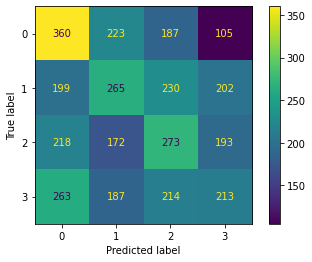

In [ ]:
ConfusionMatrixDisplay.from_predictions(Y_test, prediction)

###### K-Nearest Neighbors

In [ ]:
nearest_neighbors = 5
parameters = {"nearest_neighbors":nearest_neighbors}
model = KNeighborsClassifier(nearest_neighbors)
model.fit(X_train, Y_train)
prediction = model.predict(X_test)
print("="*50)
print(f"Model {model} Result with {X_train.shape[1]} Features: ")
store_comp_data('K-Nearest Neighbors', parameters, model_performance(prediction, Y_test), set_index, (X_train, X_test, Y_train, Y_test))

Model KNeighborsClassifier() Result with 24 Features: 
Accuracy :  0.7003424657534246
Precision:  0.7341300159833243
Recall   :  0.7003424657534246
F1 Score :  0.6979208382606802


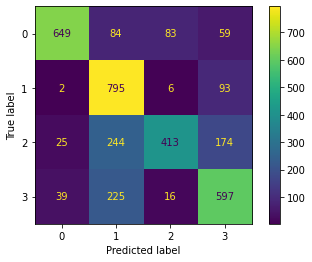

In [ ]:
ConfusionMatrixDisplay.from_predictions(Y_test, prediction)

###### SVC

In [ ]:
parameters = {}
model = SVC()
model.fit(X_train, Y_train)
prediction = model.predict(X_test)
print("="*50)
print(f"Model {model} Result with {X_train.shape[1]} Features: ")
store_comp_data('Support Vector Classification', parameters, model_performance(prediction, Y_test), set_index, (X_train, X_test, Y_train, Y_test))

Model SVC() Result with 24 Features: 
Accuracy :  0.8227739726027398
Precision:  0.8281217078837975
Recall   :  0.8227739726027398
F1 Score :  0.8219069278457202


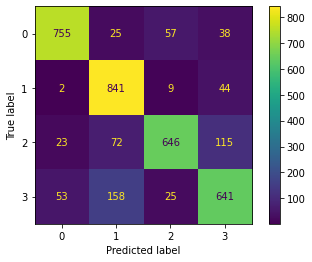

In [ ]:
ConfusionMatrixDisplay.from_predictions(Y_test, prediction)

###### Single-Layer Perceptron

In [ ]:
activation = 'logistic'
solver = "lbfgs"
hidden_layer = ()
max_iter = 1000
parameters = {'activation': activation, 'solver': solver, "hidden layers": hidden_layer, "max_iter": max_iter}
model = MLPClassifier(activation=activation, solver=solver, hidden_layer_sizes=hidden_layer, max_iter=max_iter)
model.fit(X_train, Y_train)
prediction = model.predict(X_test)
print("="*50)
print(f"Model {model} Result with {X_train.shape[1]} Features: ")
store_comp_data('Single Layer Perceptron Classifier', parameters, model_performance(prediction, Y_test), set_index, (X_train, X_test, Y_train, Y_test))

Model MLPClassifier(activation='logistic', hidden_layer_sizes=(), max_iter=1000,
              solver='lbfgs') Result with 24 Features: 
Accuracy :  0.3202054794520548
Precision:  0.32159322309245086
Recall   :  0.3202054794520548
F1 Score :  0.3122431577781379


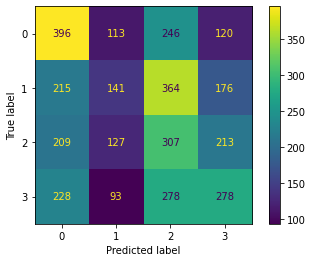

In [ ]:
ConfusionMatrixDisplay.from_predictions(Y_test, prediction)

###### Multi-Layer Perceptron

In [ ]:
activation = 'logistic'
solver = "lbfgs"
hidden_layer = (5)
max_iter = 5000
parameters = {'activation': activation, 'solver': solver, "hidden layers": hidden_layer, "max_iter": max_iter}
model = MLPClassifier(activation=activation, solver=solver, hidden_layer_sizes=hidden_layer, max_iter=max_iter)
model.fit(X_train, Y_train)
prediction = model.predict(X_test)
print("="*50)
print(f"Model {model} Result with {X_train.shape[1]} Features: ")
store_comp_data('Multi-Layer Perceptron Classifier', parameters, model_performance(prediction, Y_test), set_index, (X_train, X_test, Y_train, Y_test))

Model MLPClassifier(activation='logistic', hidden_layer_sizes=5, max_iter=5000,
              solver='lbfgs') Result with 24 Features: 
Accuracy :  0.7340182648401826
Precision:  0.7371215630622522
Recall   :  0.7340182648401826
F1 Score :  0.731986651032029


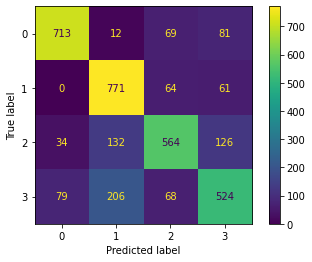

In [ ]:
ConfusionMatrixDisplay.from_predictions(Y_test, prediction)

#### Set II:

This is the second train, test split datasets we are using

##### Making Training and Testing data

In [ ]:
X_train, X_test, Y_train, Y_test = train_test_split(selected_features,gestures, test_size=test_size, random_state=random_state)
set_index = 2

##### Classification

###### Minimum Distance Classifier

In [ ]:
parameters = {}
model = NearestCentroid()
model.fit(X_train, Y_train)
prediction = model.predict(X_test)
print("="*50)
print(f"Model {model} Result with {X_train.shape[1]} Features: ")
store_comp_data('MDC', parameters, model_performance(prediction, Y_test), set_index, (X_train, X_test, Y_train, Y_test))

Model NearestCentroid() Result with 24 Features: 
Accuracy :  0.3170662100456621
Precision:  0.314986474330209
Recall   :  0.3170662100456621
F1 Score :  0.31448512534522977


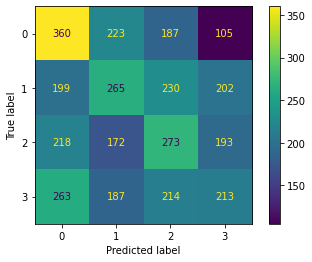

In [ ]:
ConfusionMatrixDisplay.from_predictions(Y_test, prediction)

###### K-Nearest Neighbors

In [ ]:
nearest_neighbors = 5
parameters = {"nearest_neighbors":nearest_neighbors}
model = KNeighborsClassifier(nearest_neighbors)
model.fit(X_train, Y_train)
prediction = model.predict(X_test)
print("="*50)
print(f"Model {model} Result with {X_train.shape[1]} Features: ")
store_comp_data('K-Nearest Neighbors', parameters, model_performance(prediction, Y_test), set_index, (X_train, X_test, Y_train, Y_test))

Model KNeighborsClassifier() Result with 24 Features: 
Accuracy :  0.7003424657534246
Precision:  0.7341300159833243
Recall   :  0.7003424657534246
F1 Score :  0.6979208382606802


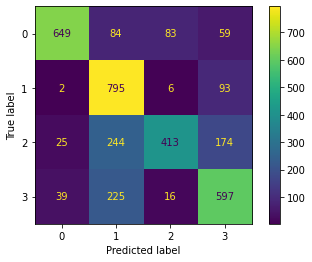

In [ ]:
ConfusionMatrixDisplay.from_predictions(Y_test, prediction)

###### SVC

In [ ]:
parameters = {}
model = SVC()
model.fit(X_train, Y_train)
prediction = model.predict(X_test)
print("="*50)
print(f"Model {model} Result with {X_train.shape[1]} Features: ")
store_comp_data('Support Vector Classification', parameters, model_performance(prediction, Y_test), set_index, (X_train, X_test, Y_train, Y_test))

Model SVC() Result with 24 Features: 
Accuracy :  0.8227739726027398
Precision:  0.8281217078837975
Recall   :  0.8227739726027398
F1 Score :  0.8219069278457202


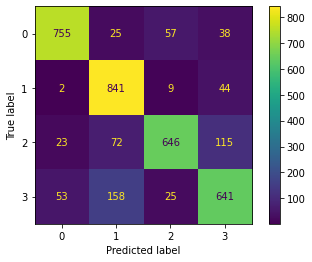

In [ ]:
ConfusionMatrixDisplay.from_predictions(Y_test, prediction)

###### Single-Layer Perceptron

In [ ]:
activation = 'logistic'
solver = "lbfgs"
hidden_layer = ()
max_iter = 1000
parameters = {'activation': activation, 'solver': solver, "hidden layers": hidden_layer, "max_iter": max_iter}
model = MLPClassifier(activation=activation, solver=solver, hidden_layer_sizes=hidden_layer, max_iter=max_iter)
model.fit(X_train, Y_train)
prediction = model.predict(X_test)
print("="*50)
print(f"Model {model} Result with {X_train.shape[1]} Features: ")
store_comp_data('Single Layer Perceptron Classifier', parameters, model_performance(prediction, Y_test), set_index, (X_train, X_test, Y_train, Y_test))

Model MLPClassifier(activation='logistic', hidden_layer_sizes=(), max_iter=1000,
              solver='lbfgs') Result with 24 Features: 
Accuracy :  0.3210616438356164
Precision:  0.32275096028607897
Recall   :  0.3210616438356164
F1 Score :  0.3135872017446044


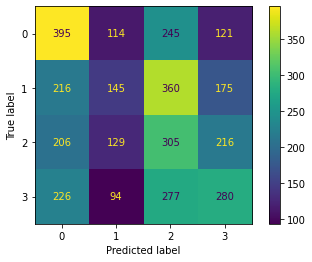

In [ ]:
ConfusionMatrixDisplay.from_predictions(Y_test, prediction)

###### Multi-Layer Perceptron

In [ ]:
activation = 'logistic'
solver = "lbfgs"
hidden_layer = (5)
max_iter = 5000
parameters = {'activation': activation, 'solver': solver, "hidden layers": hidden_layer, "max_iter": max_iter}
model = MLPClassifier(activation=activation, solver=solver, hidden_layer_sizes=hidden_layer, max_iter=max_iter)
model.fit(X_train, Y_train)
prediction = model.predict(X_test)
print("="*50)
print(f"Model {model} Result with {X_train.shape[1]} Features: ")
store_comp_data('Multi-Layer Perceptron Classifier', parameters, model_performance(prediction, Y_test), set_index, (X_train, X_test, Y_train, Y_test))

Model MLPClassifier(activation='logistic', hidden_layer_sizes=5, max_iter=5000,
              solver='lbfgs') Result with 24 Features: 
Accuracy :  0.75
Precision:  0.7523539031608691
Recall   :  0.75
F1 Score :  0.7476887123767054


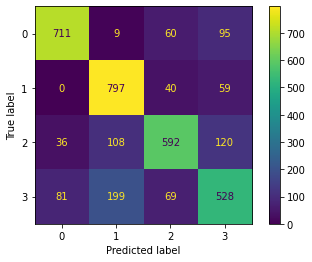

In [ ]:
ConfusionMatrixDisplay.from_predictions(Y_test, prediction)

#### Set III:

This is the third train, test split datasets we are using

##### Making Training and Testing data

In [ ]:
X_train, X_test, Y_train, Y_test = train_test_split(selected_features,gestures, test_size=test_size, random_state=random_state)
set_index = 3

##### Classification

###### Minimum Distance Classifier

In [ ]:
parameters = {}
model = NearestCentroid()
model.fit(X_train, Y_train)
prediction = model.predict(X_test)
print("="*50)
print(f"Model {model} Result with {X_train.shape[1]} Features: ")
store_comp_data('MDC', parameters, model_performance(prediction, Y_test), set_index, (X_train, X_test, Y_train, Y_test))

Model NearestCentroid() Result with 24 Features: 
Accuracy :  0.3170662100456621
Precision:  0.314986474330209
Recall   :  0.3170662100456621
F1 Score :  0.31448512534522977


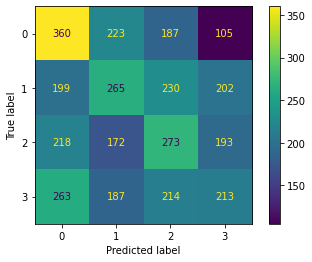

In [ ]:
ConfusionMatrixDisplay.from_predictions(Y_test, prediction)

###### K-Nearest Neighbors

In [ ]:
nearest_neighbors = 5
parameters = {"nearest_neighbors":nearest_neighbors}
model = KNeighborsClassifier(nearest_neighbors)
model.fit(X_train, Y_train)
prediction = model.predict(X_test)
print("="*50)
print(f"Model {model} Result with {X_train.shape[1]} Features: ")
store_comp_data('K-Nearest Neighbors', parameters, model_performance(prediction, Y_test), set_index, (X_train, X_test, Y_train, Y_test))

Model KNeighborsClassifier() Result with 24 Features: 
Accuracy :  0.7003424657534246
Precision:  0.7341300159833243
Recall   :  0.7003424657534246
F1 Score :  0.6979208382606802


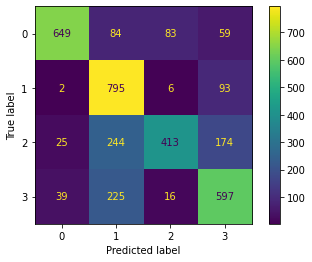

In [ ]:
ConfusionMatrixDisplay.from_predictions(Y_test, prediction)

###### SVC

In [ ]:
parameters = {}
model = SVC()
model.fit(X_train, Y_train)
prediction = model.predict(X_test)
print("="*50)
print(f"Model {model} Result with {X_train.shape[1]} Features: ")
store_comp_data('Support Vector Classification', parameters, model_performance(prediction, Y_test), set_index, (X_train, X_test, Y_train, Y_test))

Model SVC() Result with 24 Features: 
Accuracy :  0.8227739726027398
Precision:  0.8281217078837975
Recall   :  0.8227739726027398
F1 Score :  0.8219069278457202


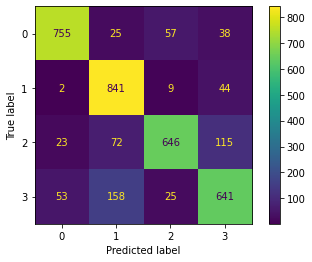

In [ ]:
ConfusionMatrixDisplay.from_predictions(Y_test, prediction)

###### Single-Layer Perceptron

In [ ]:
activation = 'logistic'
solver = "lbfgs"
hidden_layer = ()
max_iter = 1000
parameters = {'activation': activation, 'solver': solver, "hidden layers": hidden_layer, "max_iter": max_iter}
model = MLPClassifier(activation=activation, solver=solver, hidden_layer_sizes=hidden_layer, max_iter=max_iter)
model.fit(X_train, Y_train)
prediction = model.predict(X_test)
print("="*50)
print(f"Model {model} Result with {X_train.shape[1]} Features: ")
store_comp_data('Single Layer Perceptron Classifier', parameters, model_performance(prediction, Y_test), set_index, (X_train, X_test, Y_train, Y_test))

Model MLPClassifier(activation='logistic', hidden_layer_sizes=(), max_iter=1000,
              solver='lbfgs') Result with 24 Features: 
Accuracy :  0.3216324200913242
Precision:  0.32338840540592706
Recall   :  0.3216324200913242
F1 Score :  0.31430683834326034


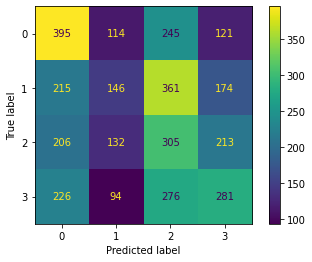

In [ ]:
ConfusionMatrixDisplay.from_predictions(Y_test, prediction)

###### Multi-Layer Perceptron

In [ ]:
activation = 'logistic'
solver = "lbfgs"
hidden_layer = (5)
max_iter = 5000
parameters = {'activation': activation, 'solver': solver, "hidden layers": hidden_layer, "max_iter": max_iter}
model = MLPClassifier(activation=activation, solver=solver, hidden_layer_sizes=hidden_layer, max_iter=max_iter)
model.fit(X_train, Y_train)
prediction = model.predict(X_test)
print("="*50)
print(f"Model {model} Result with {X_train.shape[1]} Features: ")
store_comp_data('Multi-Layer Perceptron Classifier', parameters, model_performance(prediction, Y_test), set_index, (X_train, X_test, Y_train, Y_test))

Model MLPClassifier(activation='logistic', hidden_layer_sizes=5, max_iter=5000,
              solver='lbfgs') Result with 24 Features: 
Accuracy :  0.7445776255707762
Precision:  0.746319877828571
Recall   :  0.7445776255707762
F1 Score :  0.7424702751262751


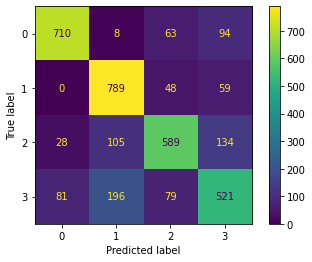

In [ ]:
ConfusionMatrixDisplay.from_predictions(Y_test, prediction)

#### Set IV:

This is the fourth train, test split datasets we are using

##### Making Training and Testing data

In [ ]:
X_train, X_test, Y_train, Y_test = train_test_split(selected_features,gestures, test_size=test_size, random_state=random_state)
set_index = 4

##### Classification

###### Minimum Distance Classifier

In [ ]:
parameters = {}
model = NearestCentroid()
model.fit(X_train, Y_train)
prediction = model.predict(X_test)
print("="*50)
print(f"Model {model} Result with {X_train.shape[1]} Features: ")
store_comp_data('MDC', parameters, model_performance(prediction, Y_test), set_index, (X_train, X_test, Y_train, Y_test))

Model NearestCentroid() Result with 24 Features: 
Accuracy :  0.3170662100456621
Precision:  0.314986474330209
Recall   :  0.3170662100456621
F1 Score :  0.31448512534522977


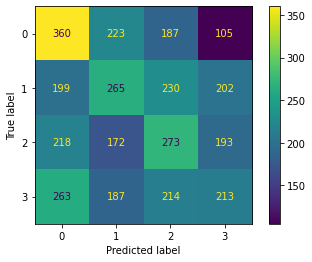

In [ ]:
ConfusionMatrixDisplay.from_predictions(Y_test, prediction)

###### K-Nearest Neighbors

In [ ]:
nearest_neighbors = 5
parameters = {"nearest_neighbors":nearest_neighbors}
model = KNeighborsClassifier(nearest_neighbors)
model.fit(X_train, Y_train)
prediction = model.predict(X_test)
print("="*50)
print(f"Model {model} Result with {X_train.shape[1]} Features: ")
store_comp_data('K-Nearest Neighbors', parameters, model_performance(prediction, Y_test), set_index, (X_train, X_test, Y_train, Y_test))

Model KNeighborsClassifier() Result with 24 Features: 
Accuracy :  0.7003424657534246
Precision:  0.7341300159833243
Recall   :  0.7003424657534246
F1 Score :  0.6979208382606802


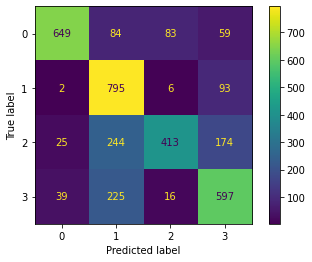

In [ ]:
ConfusionMatrixDisplay.from_predictions(Y_test, prediction)

###### SVC

In [ ]:
parameters = {}
model = SVC()
model.fit(X_train, Y_train)
prediction = model.predict(X_test)
print("="*50)
print(f"Model {model} Result with {X_train.shape[1]} Features: ")
store_comp_data('Support Vector Classification', parameters, model_performance(prediction, Y_test), set_index, (X_train, X_test, Y_train, Y_test))

Model SVC() Result with 24 Features: 
Accuracy :  0.8227739726027398
Precision:  0.8281217078837975
Recall   :  0.8227739726027398
F1 Score :  0.8219069278457202


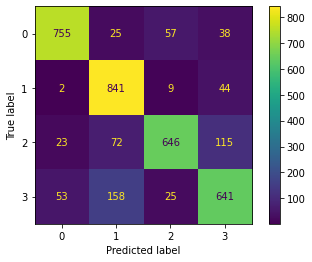

In [ ]:
ConfusionMatrixDisplay.from_predictions(Y_test, prediction)

###### Single-Layer Perceptron

In [ ]:
activation = 'logistic'
solver = "lbfgs"
hidden_layer = ()
max_iter = 1000
parameters = {'activation': activation, 'solver': solver, "hidden layers": hidden_layer, "max_iter": max_iter}
model = MLPClassifier(activation=activation, solver=solver, hidden_layer_sizes=hidden_layer, max_iter=max_iter)
model.fit(X_train, Y_train)
prediction = model.predict(X_test)
print("="*50)
print(f"Model {model} Result with {X_train.shape[1]} Features: ")
store_comp_data('Single Layer Perceptron Classifier', parameters, model_performance(prediction, Y_test), set_index, (X_train, X_test, Y_train, Y_test))

Model MLPClassifier(activation='logistic', hidden_layer_sizes=(), max_iter=1000,
              solver='lbfgs') Result with 24 Features: 
Accuracy :  0.3207762557077626
Precision:  0.32210662312129734
Recall   :  0.3207762557077626
F1 Score :  0.3131912919981698


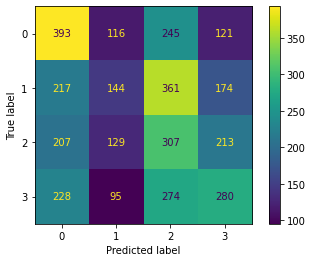

In [ ]:
ConfusionMatrixDisplay.from_predictions(Y_test, prediction)

###### Multi-Layer Perceptron

In [ ]:
activation = 'logistic'
solver = "lbfgs"
hidden_layer = (5)
max_iter = 5000
parameters = {'activation': activation, 'solver': solver, "hidden layers": hidden_layer, "max_iter": max_iter}
model = MLPClassifier(activation=activation, solver=solver, hidden_layer_sizes=hidden_layer, max_iter=max_iter)
model.fit(X_train, Y_train)
prediction = model.predict(X_test)
print("="*50)
print(f"Model {model} Result with {X_train.shape[1]} Features: ")
store_comp_data('Multi-Layer Perceptron Classifier', parameters, model_performance(prediction, Y_test), set_index, (X_train, X_test, Y_train, Y_test))

Model MLPClassifier(activation='logistic', hidden_layer_sizes=5, max_iter=5000,
              solver='lbfgs') Result with 24 Features: 
Accuracy :  0.7537100456621004
Precision:  0.756960991986502
Recall   :  0.7537100456621004
F1 Score :  0.7521217856509238


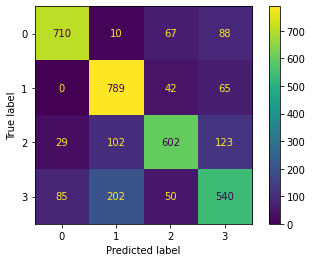

In [ ]:
ConfusionMatrixDisplay.from_predictions(Y_test, prediction)

#### Set V:

This is the fifth train, test split datasets we are using

##### Making Training and Testing data

In [ ]:
X_train, X_test, Y_train, Y_test = train_test_split(selected_features,gestures, test_size=test_size, random_state=random_state)
set_index = 5

##### Classification

###### Minimum Distance Classifier

In [ ]:
parameters = {}
model = NearestCentroid()
model.fit(X_train, Y_train)
prediction = model.predict(X_test)
print("="*50)
print(f"Model {model} Result with {X_train.shape[1]} Features: ")
store_comp_data('MDC', parameters, model_performance(prediction, Y_test), set_index, (X_train, X_test, Y_train, Y_test))

Model NearestCentroid() Result with 24 Features: 
Accuracy :  0.3170662100456621
Precision:  0.314986474330209
Recall   :  0.3170662100456621
F1 Score :  0.31448512534522977


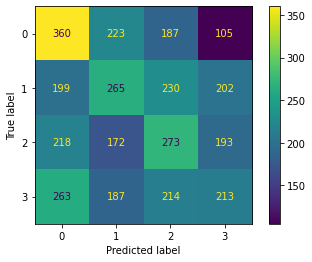

In [ ]:
ConfusionMatrixDisplay.from_predictions(Y_test, prediction)

###### K-Nearest Neighbors

In [ ]:
nearest_neighbors = 5
parameters = {"nearest_neighbors":nearest_neighbors}
model = KNeighborsClassifier(nearest_neighbors)
model.fit(X_train, Y_train)
prediction = model.predict(X_test)
print("="*50)
print(f"Model {model} Result with {X_train.shape[1]} Features: ")
store_comp_data('K-Nearest Neighbors', parameters, model_performance(prediction, Y_test), set_index, (X_train, X_test, Y_train, Y_test))

Model KNeighborsClassifier() Result with 24 Features: 
Accuracy :  0.7003424657534246
Precision:  0.7341300159833243
Recall   :  0.7003424657534246
F1 Score :  0.6979208382606802


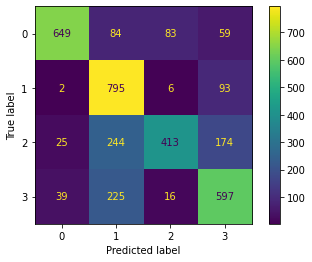

In [ ]:
ConfusionMatrixDisplay.from_predictions(Y_test, prediction)

###### SVC

In [ ]:
parameters = {}
model = SVC()
model.fit(X_train, Y_train)
prediction = model.predict(X_test)
print("="*50)
print(f"Model {model} Result with {X_train.shape[1]} Features: ")
store_comp_data('Support Vector Classification', parameters, model_performance(prediction, Y_test), set_index, (X_train, X_test, Y_train, Y_test))

Model SVC() Result with 24 Features: 
Accuracy :  0.8227739726027398
Precision:  0.8281217078837975
Recall   :  0.8227739726027398
F1 Score :  0.8219069278457202


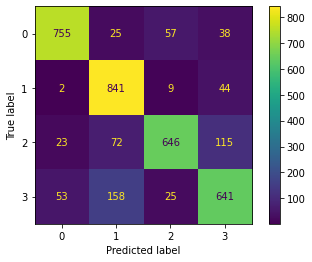

In [ ]:
ConfusionMatrixDisplay.from_predictions(Y_test, prediction)

###### Single-Layer Perceptron

In [ ]:
activation = 'logistic'
solver = "lbfgs"
hidden_layer = ()
max_iter = 1000
parameters = {'activation': activation, 'solver': solver, "hidden layers": hidden_layer, "max_iter": max_iter}
model = MLPClassifier(activation=activation, solver=solver, hidden_layer_sizes=hidden_layer, max_iter=max_iter)
model.fit(X_train, Y_train)
prediction = model.predict(X_test)
print("="*50)
print(f"Model {model} Result with {X_train.shape[1]} Features: ")
store_comp_data('Single Layer Perceptron Classifier', parameters, model_performance(prediction, Y_test), set_index, (X_train, X_test, Y_train, Y_test))

Model MLPClassifier(activation='logistic', hidden_layer_sizes=(), max_iter=1000,
              solver='lbfgs') Result with 24 Features: 
Accuracy :  0.3216324200913242
Precision:  0.32295133925264097
Recall   :  0.3216324200913242
F1 Score :  0.31405955140986735


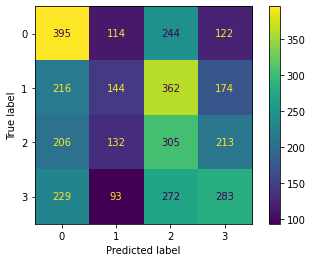

In [ ]:
ConfusionMatrixDisplay.from_predictions(Y_test, prediction)

###### Multi-Layer Perceptron

In [ ]:
activation = 'logistic'
solver = "lbfgs"
hidden_layer = (5)
max_iter = 5000
parameters = {'activation': activation, 'solver': solver, "hidden layers": hidden_layer, "max_iter": max_iter}
model = MLPClassifier(activation=activation, solver=solver, hidden_layer_sizes=hidden_layer, max_iter=max_iter)
model.fit(X_train, Y_train)
prediction = model.predict(X_test)
print("="*50)
print(f"Model {model} Result with {X_train.shape[1]} Features: ")
store_comp_data('Multi-Layer Perceptron Classifier', parameters, model_performance(prediction, Y_test), set_index, (X_train, X_test, Y_train, Y_test))

Model MLPClassifier(activation='logistic', hidden_layer_sizes=5, max_iter=5000,
              solver='lbfgs') Result with 24 Features: 
Accuracy :  0.7482876712328768
Precision:  0.751124129565375
Recall   :  0.7482876712328768
F1 Score :  0.746191289295452


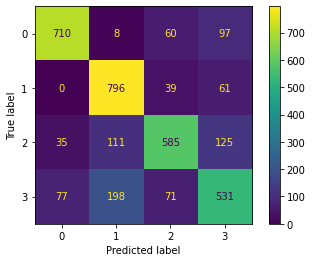

In [ ]:
ConfusionMatrixDisplay.from_predictions(Y_test, prediction)

##### Ranking of Classifiers according to thier accuracy.

In [ ]:
comparison_df = pd.DataFrame(comparison_model)
comparison_df[['Model','Accuracy','Precision','Recall','F1','Set']].sort_values('Accuracy', ascending=False)

,Model,Accuracy,Precision,Recall,F1,Set
12,Support Vector Classification,0.822774,0.828122,0.822774,0.821907,3
7,Support Vector Classification,0.822774,0.828122,0.822774,0.821907,2
2,Support Vector Classification,0.822774,0.828122,0.822774,0.821907,1
22,Support Vector Classification,0.822774,0.828122,0.822774,0.821907,5
17,Support Vector Classification,0.822774,0.828122,0.822774,0.821907,4
19,Multi-Layer Perceptron Classifier,0.753710,0.756961,0.753710,0.752122,4
9,Multi-Layer Perceptron Classifier,0.750000,0.752354,0.750000,0.747689,2
24,Multi-Layer Perceptron Classifier,0.748288,0.751124,0.748288,0.746191,5
14,Multi-Layer Perceptron Classifier,0.744578,0.746320,0.744578,0.742470,3
4,Multi-Layer Perceptron Classifier,0.734018,0.737122,0.734018,0.731987,1


## Conclusion:

As can be seen, the Support Vector Classifier is the best classifier for this problem. It performance is not affected by choice of train-test split.

However, for neural-network based classifiers the train-test split seems to matter more. The performance of these classifiers are varying with the choice of split. In fact, sometimes the choice of train-test split can cause multi-layer perceptron classifier to be trained improperly and may require more iterations.

For MDC and KNN classifiers, there is no effect of train-test splits.

In terms of performance, the classifiers can be ranked as follows:
1. Support Vector Machine
2. Multi-layer Perceptron
3. K-Nearest Neighbors
4. Single-Layer Perceptron
5. MDC